In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **PROJET SEGMENTATION IMAGE SATELLITE DYNAMIC EARTH NET**
*by Ines Lalou et Daganaud Lily*

## **Presentation du projet**

### Présentation du dataset global

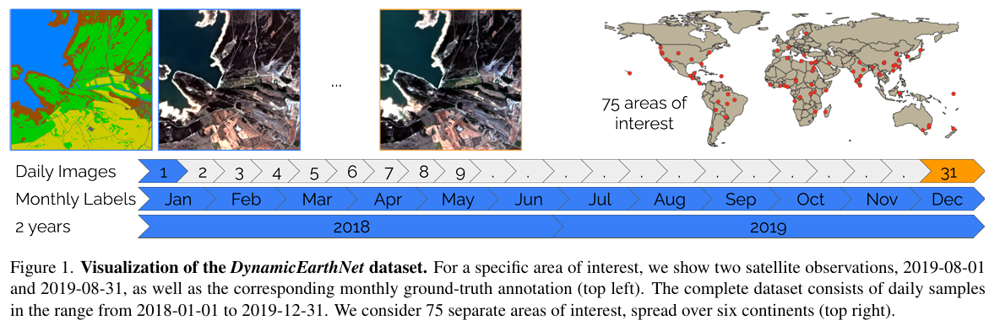

Le dataset DynamicEarthNet est une base de données d’images satellites multi-spectrales. Il se distingue par une couverture quotidienne et des annotations mensuelles, sur une période de deux ans (de janvier 2018 à décembre 2019).

Chaque image contient quatre bandes spectrales : Rouge, Vert, Bleu (RGB) et Infrarouge proche (NIR). Un prétraitement avancé garantit l’absence d’occlusions dues aux nuages ou autres artefacts atmosphériques.
Répartition des Classes et Annotations
DynamicEarthNet comprend 75 zones d’intérêt (AOI) réparties sur six continents. Chaque image est accompagnée d’annotations sémantiques permettant la classification de sept catégories d’occupation des sols :

Surfaces imperméables (7,1 %), Agriculture (10,3 %), Forêt et autres végétations (44,9 %), Zones humides (0,7 %), Sol nu (28,0 %), Eau (8,0 %), Neige et glace (1,0 %). La première image annotée de chaque zone sert de référence, et les annotations mensuelles suivantes sont mises à jour en cas de détection de changements perceptibles.

Volume et Différence entre Images Labellisées et Non-Labelisées
Le dataset totalise 54 750 images satellites, dont 1 800 sont annotées avec des masques de segmentation correspondant au premier jour de chaque mois.

Les images labellisées nous permettent de faire de l'apprentissage supervisé tandis que les images non labelisée nous permettent d'exploiter des approches semi supervisé.


### Explication du projet

Pour ce projet, nous avons décidé de reproduire la segmentation effectuée sur les images labellisées. Pour cela, nous allons, dans un premier temps, construire notre dataset, explorer les données multi-spectrales, effectuer du prétraitement, concevoir un modèle from scratch, explorer l'utilisation d'un modèle pré-entraîné et étudier la possibilité de réaliser une segmentation semi-supervisée.

En raison de contraintes de stockage et de puissance de calcul, nous avons pu exploiter uniquement une petite partie des données.

## **Importation**

In [ ]:
!pip install torch torchvision numpy matplotlib rasterio albumentations matplotlib.colors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 97.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
!pip install -q segmentation-models-pytorch

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 8.7 MB/s eta 0:00:00


In [ ]:
import glob
import os
import random
from itertools import product
from pathlib import Path

import albumentations as A
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import rasterio
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from albumentations.pytorch import ToTensorV2
from matplotlib.colors import ListedColormap
from sklearn.metrics import confusion_matrix
from torch.utils.data import DataLoader, Dataset
import matplotlib.colors as mcolors
import segmentation_models_pytorch as smp


## **Création Dataset**

Les auteurs de **DynamicEarthNet** ont publié un **split** sur GitHub sous forme de fichiers **TXT** (contenant les liens des images et labels dans *train.txt, val.txt* et *test.txt*). Nous avons donc réutilisé ce partitionnement pour charger les données et créer notre dataset.

In [ ]:
input_file = "/content/final_filtered_paths.txt"
output_dir = "/content/drive/MyDrive/Data_Projet"

with open(input_file, "r", encoding="utf-8") as f:
    lines = f.readlines()
random.shuffle(lines)

#split
total = len(lines)
train_size = int(0.7 * total)
dev_size = int(0.2 * total)

train_data = lines[:train_size]
dev_data = lines[train_size:train_size + dev_size]
test_data = lines[train_size + dev_size:]

def save_file(filename, data):
    with open(os.path.join(output_dir, filename), "w", encoding="utf-8") as f:
        f.writelines(data)


save_file("train.txt", train_data)
save_file("dev.txt", dev_data)
save_file("test.txt", test_data)

print(f"Fichiers enregistrés dans {output_dir}")

Fichiers enregistrés dans /content/drive/MyDrive/Data_Projet


In [ ]:
LOCAL_DATASET_PATH = "/content/drive/MyDrive/Data_Projet/"

#fichier sans label
IGNORED_REGIONS = {"34S", "35N","39N"}

def find_image_path(region, sub_region, date):
    search_pattern = os.path.join(LOCAL_DATASET_PATH, f"planet{region}/planet", region, sub_region, date + ".tif").replace("\\", "/")
    test_folder = os.path.join(LOCAL_DATASET_PATH, f"planet{region}/planet", region)

    if not os.path.exists(test_folder):
        #print(f"Le dossier n'existe pas : {test_folder}")
        return None

    matches = glob.glob(search_pattern, recursive=True)

    if not matches:
        #print(f"Aucun fichier trouvé pour {search_pattern}")
        return None

    return matches[0]

def find_label_path(label_relative_path):
    full_label_path = os.path.join(LOCAL_DATASET_PATH, "labels", label_relative_path).replace("\\", "/")

    if not os.path.exists(full_label_path):
        #print(f"Fichier label introuvable : {full_label_path}")
        return None

    return full_label_path

def load_splits(file_path, dataset_name):
    image_paths = []
    label_paths = []

    with open(file_path, "r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split(" ")
            if len(parts) < 3:
                continue

            image_relative_path = parts[0]
            label_relative_path = parts[1].lstrip("/")
            date = parts[2] + '-01'
            date = date.replace("_", "-")

            path_parts = image_relative_path.split("/")
            if len(path_parts) < 4:
                continue

            region = path_parts[3]  # Exemple: "10N"
            if region in IGNORED_REGIONS:
                continue

            sub_region = "/".join(path_parts[4:])

            image_path = find_image_path(region, sub_region, date)
            label_path = find_label_path(label_relative_path)

            if not image_path or not label_path:
                #print(f" Fichier manquant : {image_path} ou {label_path}")
                continue

            image_paths.append(image_path)
            label_paths.append(label_path)

    return image_paths, label_paths

train_images, train_labels = load_splits(os.path.join(LOCAL_DATASET_PATH, "train.txt"), "Train")
val_images, val_labels = load_splits(os.path.join(LOCAL_DATASET_PATH, "dev.txt"), "Validation")
test_images, test_labels = load_splits(os.path.join(LOCAL_DATASET_PATH, "test.txt"), "Test")

print(f"Train       : {len(train_images)} images")
print(f"Validation  : {len(val_images)} images")
print(f"Test        : {len(test_images)} images")

Train       : 114 images
Validation  : 29 images
Test        : 25 images


Comme mentionnée plus haut, nous avons du pour des raisons de stockages et puissance de calcule construire un dataset très petit. Rien que le téléchargement et le de zippage de quelques fichiers étaient très couteux, et lourd pour notre materiel. Nous avons toutes les deux travaillées sur des fichiers différentes afin de voir également les variations entre les datasets. Ici le premier est composé de 121 images en train, 33 en validation et 14 en test. Nous avons utilisé les fichiers de 10N, 13N, 11N, 38N , 38S, 54N.

## **Exploration Image**

### Exploration d'une image

In [ ]:
img_path = '/content/drive/MyDrive/Data_Projet/planet38S/planet/38S/19E-324N/5111_4560_13/PF-SR/2018-03-01.tif'

with rasterio.open(img_path) as src:
    image = src.read()
    meta = src.meta

print("Dime:", image.shape)
print("Nb total de pixels:", image.shape[1] * image.shape[2])
print("Type de data:", image.dtype)
print("Valeurs min/max:", image.min(), image.max())

Dime: (4, 1024, 1024)
Nb total de pixels: 1048576
Type de data: int16
Valeurs min/max: 40 5920


In [ ]:
mean_values = image.mean(axis=(1, 2))
std_values = image.std(axis=(1, 2))

for i in range(image.shape[0]):
    print(f"{i+1} - mean: {mean_values[i]:.2f}, std: {std_values[i]:.2f}")

1 - mean: 304.25, std: 113.73
2 - mean: 554.38, std: 157.99
3 - mean: 505.37, std: 272.86
4 - mean: 3249.46, std: 718.56


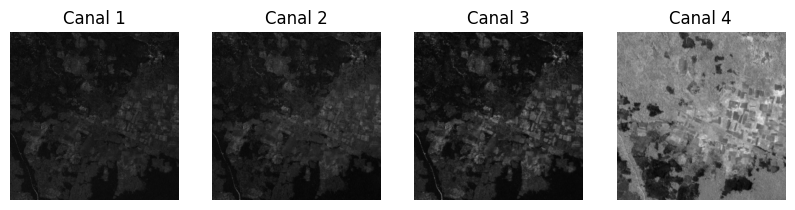

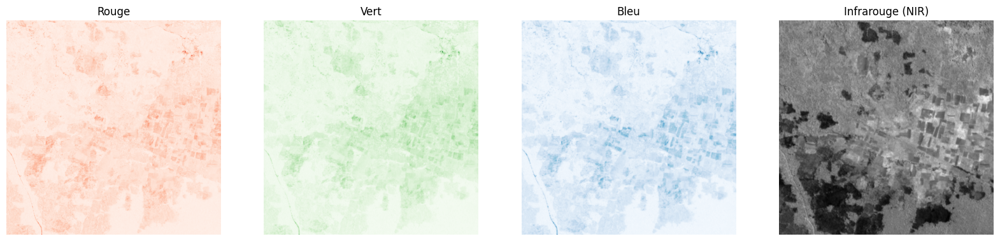

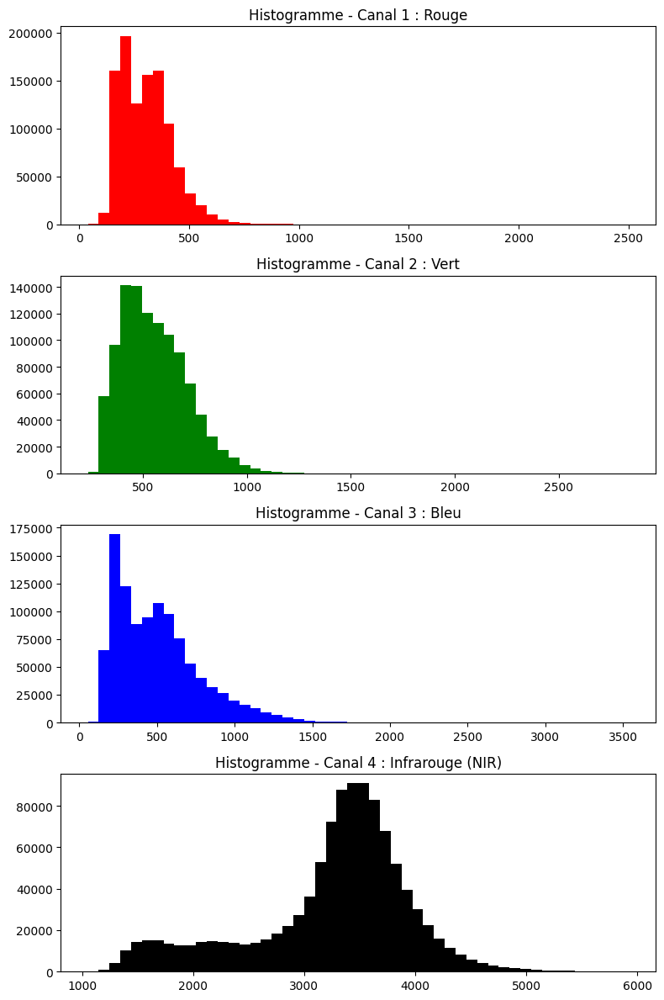

In [ ]:
fig, axs = plt.subplots(1, image.shape[0], figsize=(10, 5))
for i in range(image.shape[0]):
    axs[i].imshow(image[i], cmap='gray')
    axs[i].set_title(f"Canal {i+1}")
    axs[i].axis('off')
plt.show()

# Affichage avec les couleurs spécifiques
fig = plt.figure(figsize=(20, 6))
ax1 = fig.add_subplot(1, 4, 1)
ax1.imshow(image[0], cmap='Reds')
ax1.set_title("Rouge")
ax1.axis('off')

ax2 = fig.add_subplot(1, 4, 2)
ax2.imshow(image[1], cmap='Greens')
ax2.set_title("Vert")
ax2.axis('off')

ax3 = fig.add_subplot(1, 4, 3)
ax3.imshow(image[2], cmap='Blues')
ax3.set_title("Bleu")
ax3.axis('off')

ax4 = fig.add_subplot(1, 4, 4)
ax4.imshow(image[3], cmap='gray')
ax4.set_title("Infrarouge (NIR)")
ax4.axis('off')

plt.show()

fig, axs = plt.subplots(image.shape[0], 1, figsize=(8, 12))
colors = ['red', 'green', 'blue', 'black']  # Noir pour IR
titles = ["Canal 1 : Rouge", "Canal 2 : Vert", "Canal 3 : Bleu", "Canal 4 : Infrarouge (NIR)"]

for i in range(image.shape[0]):
    axs[i].hist(image[i].flatten(), bins=50, color=colors[i])
    axs[i].set_title(f"Histogramme - {titles[i]}")
plt.tight_layout()
plt.show()


Nous remarquons que les images comportent 4 canaux, la taille de l'image est de (1024,1024). Les valeurs sont stockées en int et comprises entre 40 à 5920. On regarde aussi les valeurs d'un pixel sur les différents canaux ainsi que les moyennes, std. On ne remarque rien d'anormal. Les canaux 1,2,3 semblent similaires que ce soit sur les histogrammes ou en regardant les valeurs des moyennes et std. Les trois premiers canaux (Rouge, Vert, Bleu) ont des valeurs assez basses, l’image semble plutôt sombre dans le spectre visible. Le canal NIR a des valeurs bien plus élevées. Il semble mieux capturer les variations du paysage, notamment des motifs agricoles bien visibles. On va devoir surement en avoir besoin pour que notre modele soit plus pertinent .

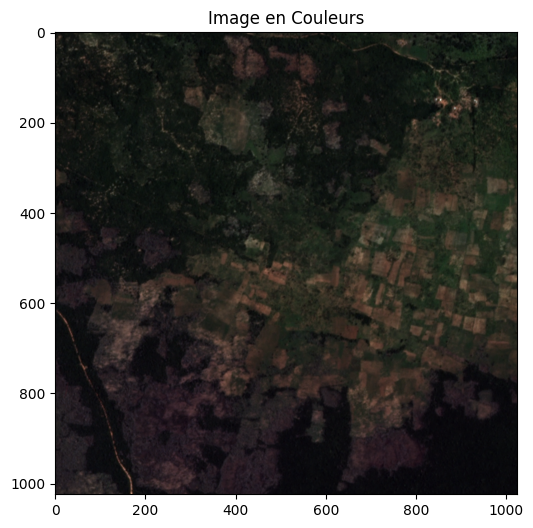

In [ ]:
def normalize(img):
    return (img - img.min()) / (img.max() - img.min())

rgb = np.stack([normalize(image[2]), normalize(image[1]), normalize(image[0])], axis=-1)


# Affichage des images
fig, axs = plt.subplots(1, figsize=(12, 6))

axs.imshow(rgb)
axs.set_title("Image en Couleurs")
plt.show()

On voit effectivement, une forte vegetation et se qui semble etre des terres agricoles ou peut etre des maisons. Allons voir ce que donne l'image labelisée

### Exploration d'une image labelisée

In [ ]:
LULC_CLASSES = {
    0: "Impervious Surface",
    1: "Agriculture",
    2: "Forest & Vegetation",
    3: "Wetlands",
    4: "Soil",
    5: "Water",
    6: "Snow & Ice"
}

LULC_COLORS = {
    0: (200, 200, 200),
    1: (255, 165, 0),
    2: (0, 100, 0),
    3: (0, 255, 255),
    4: (139, 69, 19),
    5: (0, 0, 139),
    6: (255, 250, 250)
}

LULC_CMAP = mcolors.ListedColormap(np.array(list(LULC_COLORS.values())) / 255.0)

In [ ]:
label_path = "/content/drive/MyDrive/Data_Projet/labels/labels/5111_4560_13_38S/Labels/Raster/38S-44E-19S-L3H-SR/38S-44E-19S-L3H-SR-2018-03-01.tif"

In [ ]:
with rasterio.open(label_path) as src:
    labels = src.read()
    meta = src.meta

print("Dim:", labels.shape)
print("Nb pixels:", labels.shape[1] * labels.shape[2])
print("Type:", labels.dtype)
print("Valeurs min/max:", labels.min(), labels.max())

x, y = labels.shape[1] // 2, labels.shape[2] // 2
pixel_values = labels[:, x, y]
print(f"Pixel ({x}, {y}): {pixel_values}")


mean_values = labels.mean(axis=(1, 2))
std_values = labels.std(axis=(1, 2))
for i in range(labels.shape[0]):
    print(f"{i+1} - Mean: {mean_values[i]:.2f}, std: {std_values[i]:.2f}")


Dim: (7, 1024, 1024)
Nb pixels: 1048576
Type: uint8
Valeurs min/max: 0 255
Pixel (512, 512): [  0   0   0   0 255   0   0]
1 - Mean: 2.38, std: 24.53
2 - Mean: 0.00, std: 0.00
3 - Mean: 183.17, std: 114.70
4 - Mean: 0.00, std: 0.00
5 - Mean: 69.45, std: 113.52
6 - Mean: 0.00, std: 0.00
7 - Mean: 0.00, std: 0.00


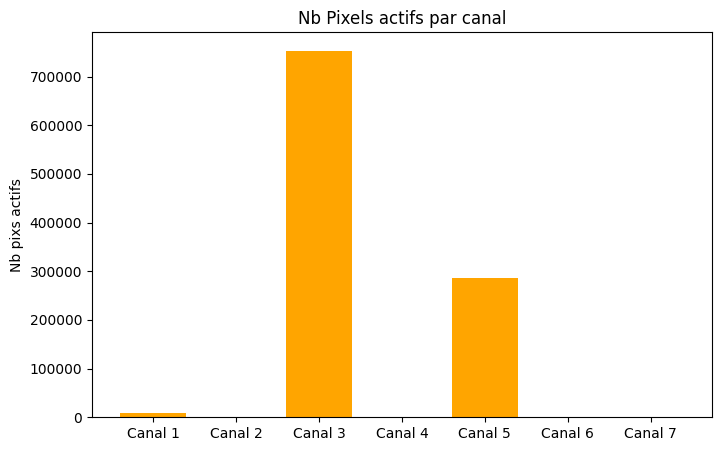

In [ ]:
active_pix = [(labels[i] > 0).sum() for i in range(labels.shape[0])]

plt.figure(figsize=(8, 5))
plt.bar(range(1, labels.shape[0] + 1), active_pix, color="orange")
plt.ylabel("Nb pixs actifs")
plt.title("Nb Pixels actifs par canal")
plt.xticks(range(1, labels.shape[0] + 1), [f"Canal {i+1}" for i in range(labels.shape[0])])

plt.show()

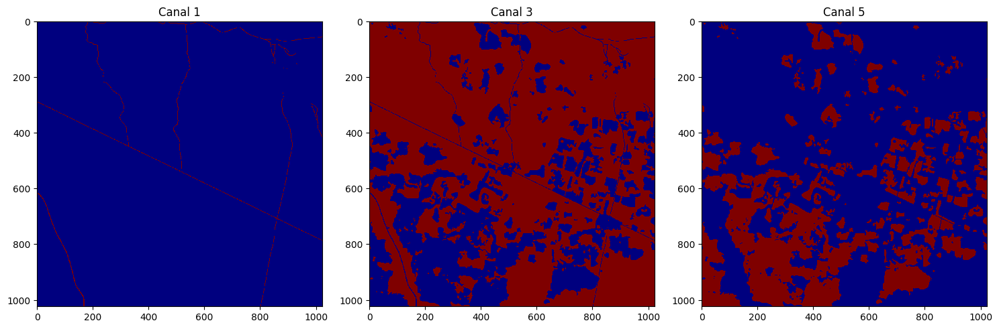

In [ ]:
non_empty_channels = [i for i in range(labels.shape[0]) if labels[i].sum() > 0]
fig, axs = plt.subplots(1, len(non_empty_channels), figsize=(15, 5))

for idx, i in enumerate(non_empty_channels):
    axs[idx].imshow(labels[i], cmap='jet', interpolation='nearest')
    axs[idx].set_title(f"Canal {i+1}")

plt.tight_layout()
plt.show()


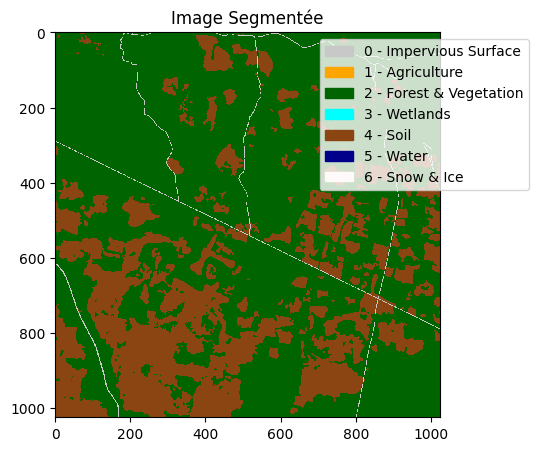

In [ ]:
segmented_image = np.argmax(labels, axis=0)

fig, ax = plt.subplots(figsize=(5, 5))
im = ax.imshow(segmented_image, cmap=LULC_CMAP, interpolation='nearest', vmin=0, vmax=6)
ax.set_title("Image Segmentée")


patches = [mpatches.Patch(color=np.array(LULC_COLORS[i]) / 255.0, label=f"{i} - {LULC_CLASSES[i]}")
           for i in LULC_CLASSES.keys()]
ax.legend(handles=patches, loc="upper right", bbox_to_anchor=(1.25, 1))
plt.show()



On remarque que les images labellisées possèdent 7 canaux, chacun correspondant à une classe. Chaque pixel, dans chaque canal, est soit actif (valeur de 255), soit inactif (valeur de 0). A noter, chaque pixel dans le dataset DynamicEarthNet ne peut appartenir à 1 seule classe.

Dans notre exemple, nous avons observé que 3 canaux étaient actifs, principalement ceux associés à la végétation et au sol. Cela correspond aux moyennes obtenues, ce qui confirme notre analyse.

De plus, cette observation valide notre hypothèse selon laquelle le canal NIR est particulièrement efficace pour la détection de ces classes dans l’image non labellisée. Le canal NIR (Near Infrared, proche infrarouge) est particulièrement efficace pour la détection de la végétation et la différenciation des surfaces naturelles.

## **Exploration du dataset**

### Dataset non labelisé

In [ ]:
def check_image_format(image_paths):
    formats = {}

    for img_path in image_paths:
        with rasterio.open(img_path) as src:
            shape = src.shape
            dtype = src.dtypes[0]
            key = (shape, dtype)
            formats[key] = formats.get(key, 0) + 1

    print("Rép formats d'images :")
    for fmt, count in formats.items():
        print(f"Format {fmt}: {count} images")


print("Train")
check_image_format(train_images)
print("\nVal")
check_image_format(val_images)
print("\nTest")
check_image_format(test_images)


Train
Rép formats d'images :
Format ((1024, 1024), 'int16'): 114 images

Val
Rép formats d'images :
Format ((1024, 1024), 'int16'): 29 images

Test
Rép formats d'images :
Format ((1024, 1024), 'int16'): 25 images


Les tailles des images sont de la même taille. On pourra faire recadrage pour que les images soient moins volumineuse comme 512*512

In [ ]:

def compute_image_statistics(image_paths):
    means = []
    stds = []
    for path in image_paths:
        with rasterio.open(path) as src:
            img = src.read().astype(np.float32)
        img = img[:4]
        means.append(np.mean(img, axis=(1, 2)))
        stds.append(np.std(img, axis=(1, 2)))
    means = np.array(means)
    stds = np.array(stds)
    mean = np.mean(means, axis=0)
    std = np.mean(stds, axis=0)
    return mean.tolist(), std.tolist()

train_mean, train_std = compute_image_statistics(train_images)
val_mean, val_std = compute_image_statistics(val_images)
test_mean, test_std = compute_image_statistics(test_images)
print(f"Statistiques images train: mean = {train_mean}, std = {train_std}")
print(f"Statistiques images val: mean = {val_mean}, std = {val_std}")
print(f"Statistiques images test: mean = {test_mean}, std = {test_std}")

Statistiques images train: mean = [690.832763671875, 930.22314453125, 1159.728515625, 2207.56103515625], std = [257.3125305175781, 270.7231750488281, 370.0707092285156, 536.3870239257812]
Statistiques images val: mean = [645.0119018554688, 884.8859252929688, 1025.996337890625, 1954.9468994140625], std = [192.34945678710938, 206.64260864257812, 308.4312438964844, 537.7054443359375]
Statistiques images test: mean = [572.4747314453125, 803.0873413085938, 1009.92041015625, 2218.0302734375], std = [224.53875732421875, 260.2943420410156, 375.3689880371094, 650.33984375]


### Dataset labélisé

In [ ]:
print("Train")
check_image_format(train_labels)
print("\nVal")
check_image_format(val_labels)
print("\nTest")
check_image_format(test_labels)

Train
Rép formats d'images :
Format ((1024, 1024), 'uint8'): 114 images

Val
Rép formats d'images :
Format ((1024, 1024), 'uint8'): 29 images

Test
Rép formats d'images :
Format ((1024, 1024), 'uint8'): 25 images


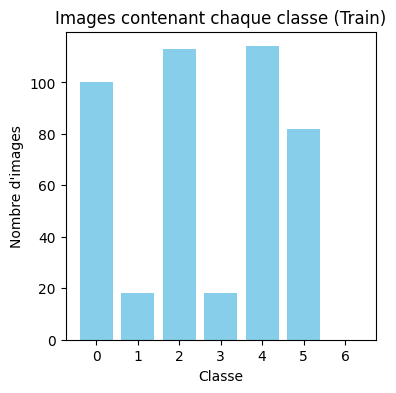

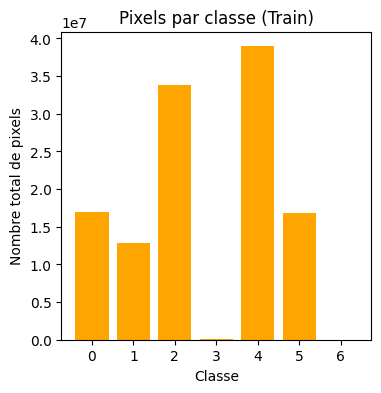

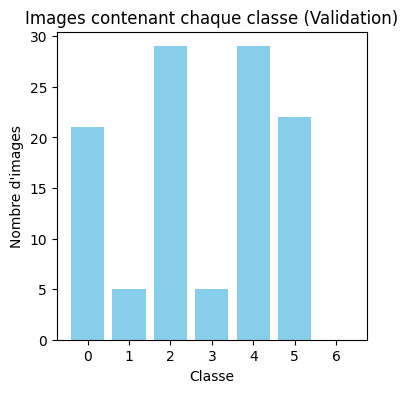

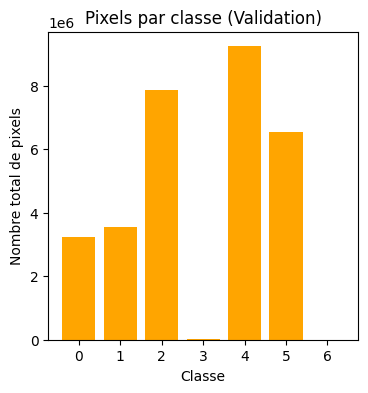

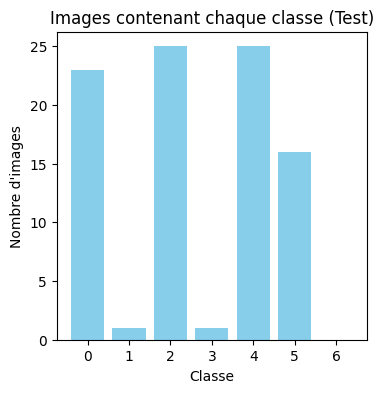

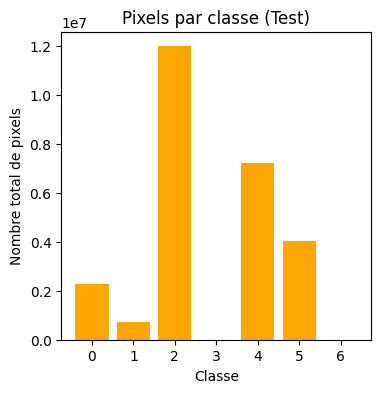

In [ ]:
def class_distribution_histogram(label_paths, dataset_name):
    class_counts = np.zeros(7)
    image_counts = np.zeros(7)

    for label_path in label_paths:
        with rasterio.open(label_path) as src:
            labels = src.read()

        for i in range(7):
            active_pixels = (labels[i] > 0).sum()
            class_counts[i] += active_pixels
            if active_pixels > 0:
                image_counts[i] += 1


    plt.figure(figsize=(4, 4))
    plt.bar(range(7), image_counts, color="skyblue")
    plt.xlabel("Classe")
    plt.ylabel("Nombre d'images")
    plt.title(f"Images contenant chaque classe ({dataset_name})")
    plt.xticks(range(7))
    plt.show()

    plt.figure(figsize=(4, 4))
    plt.bar(range(7), class_counts, color="orange")
    plt.xlabel("Classe")
    plt.ylabel("Nombre total de pixels")
    plt.title(f"Pixels par classe ({dataset_name})")
    plt.xticks(range(7))
    plt.show()

class_distribution_histogram(train_labels, "Train")
class_distribution_histogram(val_labels, "Validation")
class_distribution_histogram(test_labels, "Test")


Nous voyons que les distributions sont plutôt similaires entre le train, dev et test. Il y a majoritairement la classe 2 et 4 qui sont présente et on note l'absence de la classe 6 et légère présence de la classe 3. Il va donc etre cohérent que nos modeles ne vont pas être bon pour la ségmentation de leurs classes. Pour palier à cela nous pourrions faire de la data augmentation nottameent sur les images comportants ces classes.

In [ ]:
def average_classes_per_image(label_paths):
    total_classes = 0
    total_images = len(label_paths)

    for label_path in label_paths:
        with rasterio.open(label_path) as src:
            labels = src.read()
        active_classes = sum((labels[i] > 0).any() for i in range(7))
        total_classes += active_classes

    avg_classes = total_classes / total_images if total_images > 0 else 0
    print(f"Moyenne classes par image: {avg_classes:.2f}")

print("Train")
average_classes_per_image(train_labels)
print("Validation")
average_classes_per_image(val_labels)
print("Test")
average_classes_per_image(test_labels)


Train
Moyenne classes par image: 3.90
Validation
Moyenne classes par image: 3.83
Test
Moyenne classes par image: 3.64


In [ ]:
def dataset_statistics(label_paths):
    mean = np.zeros(7)
    std = np.zeros(7)
    total_pixels = 0

    for label_path in label_paths:
        with rasterio.open(label_path) as src:
            labels = src.read().astype(float)

        total_pixels += labels.shape[1] * labels.shape[2]

        for i in range(7):
            mean[i] += labels[i].sum()
            std[i] += (labels[i]**2).sum()

    mean /= total_pixels
    std = np.sqrt((std / total_pixels) - mean**2)

    return mean, std


train_mean, train_std = dataset_statistics(train_labels)
val_mean, val_std = dataset_statistics(val_labels)
test_mean, test_std = dataset_statistics(test_labels)

stats_labels = {
    "train": {"mean": train_mean, "std": train_std},
    "dev": {"mean": val_mean, "std": val_std},
    "test": {"mean": test_mean, "std": test_std},
}


print("Stats Labels:")
for key, value in stats_labels.items():
    print(f"{key}: Mean={value['mean']}, Std={value['std']}")



Stats Labels:
train: Mean=[36.30964631 27.29316159 72.28324451  0.13576658 83.08188213 36.01982292
  0.        ], Std=[ 89.10987259  78.83425357 114.92327838   5.88235036 119.51268052
  88.81231447   0.        ]
dev: Mean=[27.13056515 29.82785225 65.83957968  0.14470462 77.43153852 54.71675363
  0.        ], Std=[ 78.62713621  81.95365491 111.5985778    6.07278676 117.257832
 104.68452153   0.        ]
test: Mean=[2.22275986e+01 6.91886330e+00 1.16716546e+02 3.51064682e-02
 7.01192413e+01 3.91593246e+01 0.00000000e+00], Std=[ 71.93032391  41.42993448 127.04317029   2.9918083  113.85823877
  91.93571166   0.        ]


In [ ]:
label_path = train_labels[0]  # Prendre un label au hasard

with rasterio.open(label_path) as src:
    num_bands = src.count
    print(f"📊 Fichier label : {label_path}")
    print(f"🔹 Nombre de bandes : {num_bands}")

    for i in range(1, num_bands + 1):
        label = src.read(i)
        unique_values = np.unique(label)
        print(f"🔹 Bande {i} - Valeurs uniques : {unique_values}")

📊 Fichier label : /content/drive/MyDrive/Data_Projet/labels/labels/4768_4131_13_35S/Labels/Raster/35S-29E-1S-L3H-SR/35S-29E-1S-L3H-SR-2018-04-01.tif
🔹 Nombre de bandes : 7
🔹 Bande 1 - Valeurs uniques : [  0 255]
🔹 Bande 2 - Valeurs uniques : [  0 255]
🔹 Bande 3 - Valeurs uniques : [  0 255]
🔹 Bande 4 - Valeurs uniques : [  0 255]
🔹 Bande 5 - Valeurs uniques : [  0 255]
🔹 Bande 6 - Valeurs uniques : [  0 255]
🔹 Bande 7 - Valeurs uniques : [0]


## **Verification valeurs aberrantes**

In [ ]:
def check_value_ranges(image_paths):
    for img_path in image_paths:
        with rasterio.open(img_path) as src:
            image = src.read().astype(float)

        min_val, max_val = image.min(), image.max()
        if min_val < 0 or max_val > 10000: #image satelite srarement superieur à ca
            print("Valeurs anormales dans {img_path} → Min: {min_val}, Max: {max_val}")

print("Train")
check_value_ranges(train_images)
print("\nValidation")
check_value_ranges(val_images)
print("\nTest")
check_value_ranges(test_images)


Train
Valeurs anormales dans {img_path} → Min: {min_val}, Max: {max_val}

Validation

Test


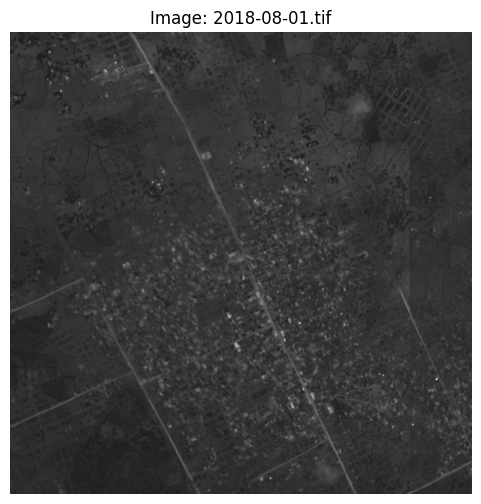

In [ ]:
image_path = "/content/drive/MyDrive/Data_Projet/planet38N/planet/38N/22E-9N/5125_4049_13/PF-SR/2018-08-01.tif"

def display_image(image_path):
    with rasterio.open(image_path) as src:
        image = src.read().astype(float)

    plt.figure(figsize=(6, 6))
    plt.imshow(image[0], cmap="gray")
    plt.title(f"Image: {image_path.split('/')[-1]}")
    plt.axis("off")
    plt.show()
display_image(image_path)



In [ ]:
def check_image_quality(image_paths):
    for img_path in image_paths:
        with rasterio.open(img_path) as src:
            image = src.read().astype(float)

        unique_values = np.unique(image)
        zero_ratio = (image == 0).sum() / image.size
        std_dev = image.std()

        if len(unique_values) < 3:
            print(f"Image suspecte {img_path} → Uniquement {unique_values}")
        if zero_ratio > 0.95:
            print(f"Image potentiellement vide {img_path} → {zero_ratio*100:.2f}% de pixels à 0")
        if std_dev < 5:
            print(f"Image trop homogène {img_path} → Écart-type: {std_dev:.2f}")

print("Train")
check_image_quality(train_images)
print("\nValidation")
check_image_quality(val_images)
print("\nTest")
check_image_quality(test_images)


Train

Validation

Test


## **Evaluation des modèles**

Avant de vous présenter nos modèles, voici les trois méthodes que nous utiliserons pour **évaluer nos prédictions de segmentation** : les métriques **IoU**, **Dice coefficient** et la **matrice de confusion**.

**IoU (Jaccard Index)**

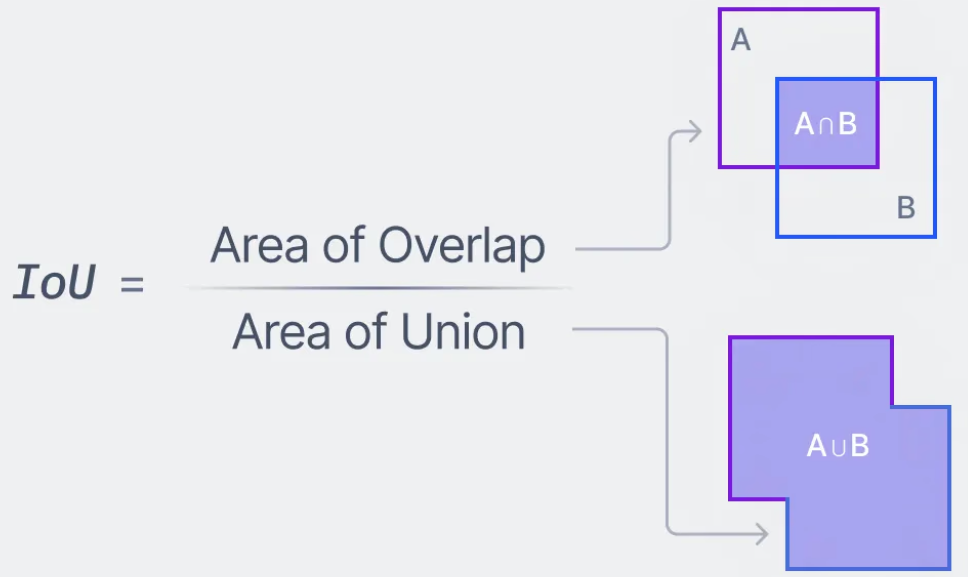

In [ ]:
import torch
import pandas as pd

def iou_coefficient(pred, target, threshold=0.5):
    """
    Calcule l'IoU (Intersection over Union) pour une segmentation binaire.
    """
    pred = (pred > threshold).float()
    intersection = torch.sum(pred * target)
    union = torch.sum(pred) + torch.sum(target) - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)  # Éviter la division par zéro
    return iou.item()

def iou_coefficient_multiclass(pred, target, num_classes):
    """
    Calcule l'IoU pour une segmentation multi-classes.
    """
    iou_scores = []

    for c in range(num_classes):
        pred_class = (pred == c).float()
        target_class = (target == c).float()
        iou_score = iou_coefficient(pred_class, target_class)
        iou_scores.append(iou_score)

    return iou_scores

def evaluate_iou(model, dataset, num_classes=7):
    """
    Évalue l'IoU moyen sur un dataset entier.
    """
    model.eval()
    device = next(model.parameters()).device
    total_iou = torch.zeros(num_classes)
    total_images = len(dataset)

    with torch.no_grad():
        for image, label in dataset:
            image = image.unsqueeze(0).to(device)
            label = label.to(device)

            output = model(image)
            predicted = torch.argmax(output, dim=1).squeeze(0).cpu()

            iou_scores = iou_coefficient_multiclass(predicted, label.cpu(), num_classes)
            total_iou += torch.tensor(iou_scores)

    # Moyenne par classe
    average_iou = (total_iou / total_images) * 100
    df = pd.DataFrame({
        "Classe": list(range(num_classes)),
        "IoU (%)": average_iou.numpy()
    })
    print("\nIoU par classe :")
    print(df.to_string(index=False, formatters={"IoU (%)": "{:.2f}%".format}))

    # Moyenne globale
    mean_iou = average_iou.mean().item()
    print(f'\nIoU moyen sur le dataset : {mean_iou:.2f}%')

    return df, mean_iou

**DICE Coefficient**

Le Dice Coefficient (DICE) est une métrique largement utilisée pour évaluer la qualité de segmentation. Il mesure le chevauchement entre la segmentation prédite et la vérité terrain (ground truth).

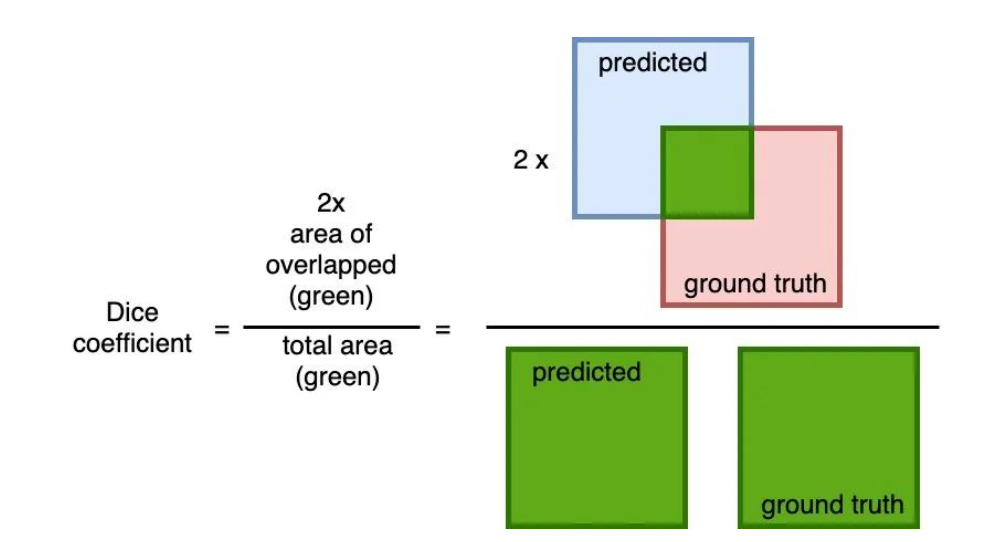

In [ ]:
import torch
import pandas as pd

def dice_coefficient(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    intersection = torch.sum(pred * target)
    union = torch.sum(pred) + torch.sum(target)
    dice = (2. * intersection + 1e-6) / (union + 1e-6)  # Éviter division par zéro
    return dice.item()

def dice_coefficient_multiclass(pred, target, num_classes):
    dice_scores = []

    for c in range(num_classes):
        pred_class = (pred == c).float()
        target_class = (target == c).float()
        dice_score = dice_coefficient(pred_class, target_class)
        dice_scores.append(dice_score.item())

    return dice_scores

def evaluate_dice(model, dataset, num_classes=7):
    model.eval()
    device = next(model.parameters()).device
    total_dice = torch.zeros(num_classes)
    total_images = len(dataset)

    with torch.no_grad():
        for image, label in dataset:
            image = image.unsqueeze(0).to(device)  # envoyer sur GPU
            label = label.to(device)  # Envoyer le label sur GPU

            output = model(image)
            predicted = torch.argmax(output, dim=1).squeeze(0).cpu()  # Repasser sur CPU

            for c in range(num_classes):
                pred_class = (predicted == c).float()
                target_class = (label.cpu() == c).float()
                total_dice[c] += dice_coefficient(pred_class, target_class)

    average_dice = (total_dice / total_images) * 100

    df = pd.DataFrame({
        "Classe": list(range(num_classes)),
        "DICE Coefficient (%)": average_dice.numpy()
    })

    print("\nDICE coefficient par classe :")
    print(df.to_string(index=False, formatters={"DICE Coefficient (%)": "{:.2f}%".format}))

    mean_dice = average_dice.mean().item()
    print(f'\nDICE coefficient moyen sur le dataset : {mean_dice:.2f}%')


    return df, mean_dice



**Matrice de confusion**

La Matrice de confusion nous permettrra d'analyser visuellement les performances de nos modèles sur chaque classe.

In [ ]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, num_classes):
    cm = confusion_matrix(y_true, y_pred, labels=range(num_classes))
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_percentage, annot=True, fmt=".2f", cmap="Blues",
                xticklabels=range(num_classes), yticklabels=range(num_classes),
                cbar_kws={'label': 'Pourcentage (%)'})
    plt.xlabel('Classe Prédite')
    plt.ylabel('Classe Réelle')
    plt.title(f'Matrice de Confusion avec Pourcentages')
    plt.show()


## **Modele from scratch**

**1. Présentation du modèle**

U-Net est un réseau de neurones convolutifs introduit par Ronneberger et al. (2015) pour la segmentation d’images biomédicales. Il combine apprentissage local et global, permettant de segmenter efficacement des images même avec peu de données annotées, un atout majeur dans le domaine médical.
Depuis, il a été largement adopté en télédétection et en vision par ordinateur.

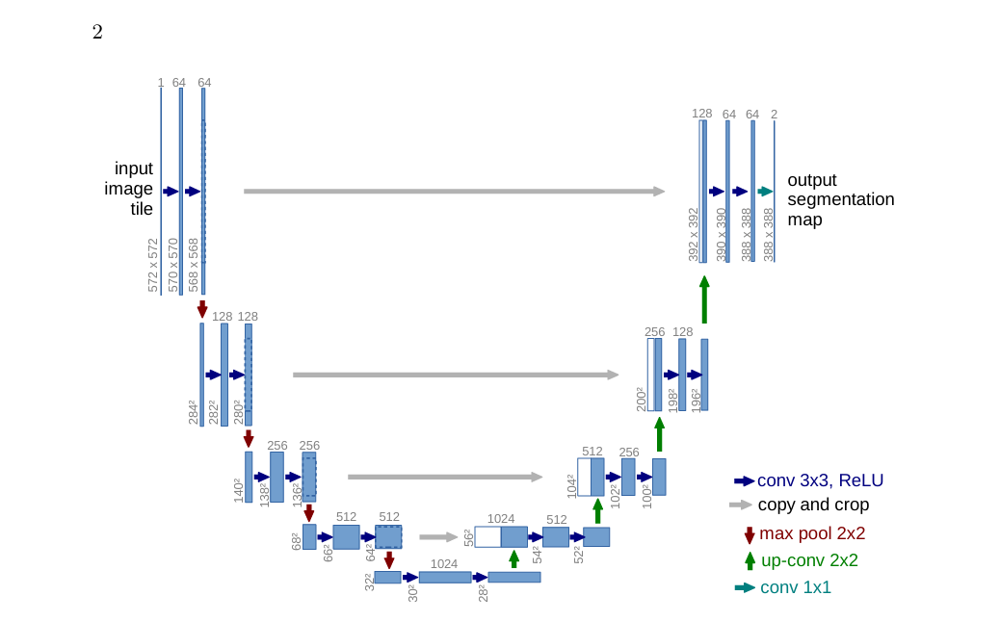


**2. Architecture et Fonctionnement**

Le nom U-Net provient de son architecture en forme de U.
Elle repose sur trois parties principales :

**Encodage (Contracting Path) :** Séries de convolutions 3×3 suivies de ReLU et d’un max pooling (2×2) pour extraire des caractéristiques à différentes échelles.
Chaque étape double le nombre de filtres pour capturer des informations plus complexes.

**Bottleneck :** Partie la plus profonde du réseau, où les caractéristiques les plus abstraites sont apprises.

**Décodage (Expanding Path) :** Upsampling (2×2) suivi de convolutions pour reconstruire la segmentation.
Skip connections reliant l’encodeur au décodeur permettent de récupérer les détails fins perdus pendant le pooling.

**Dernière couche :**
Convolution 1×1 pour obtenir une segmentation pixel-wise.




**3. Pourquoi U-NET ?**

U-Net est particulièrement adapté à notre tâche de segmentation, car :

- Gère la segmentation multiclasses (7 labels dans notre cas).
- Compatible avec les images multispectrales (R, G, B, Near-InfraRed).
- Fonctionne avec peu d’exemples annotés.
- Réseau éprouvé dans les challenges de segmentation en vision par ordinateur.
- Architecture flexible, permettant d’intégrer des variantes comme UTAE -> Donc plusieurs pistes possibles à explorer

**Chargement/Traitement des données :**

(**NB** : Il s'agit d'un second chargement des données, car nous avons travaillé séparément sur des ensembles de données et des drives différents.)

Les images sont classées dans des dossiers par région, tandis que les labels sont séparés en dossiers labels (train) et dynamicearthnet_test_labels (test/val). Il faut reconstruire leurs chemins pour les associer.

Par faute d'espace mémoire, nous avons pu prendre des images de 8 régions différentes sur 39 (soit 1/4 du dataset)

In [ ]:
LOCAL_DATASET_PATH = "/content/drive/My Drive/DynNet/"

# Fonction pour retrouver le chemin correct d'une image
def find_image_path(region, sub_region, date):
    """
    Recherche une image en fonction de la région (ex: "11N"),
    de la sous-région (ex: "18E-155N/1417_3281_13/PF-SR") et de la date (ex: "2018-01-01.tif").
    """
    search_pattern = os.path.join(LOCAL_DATASET_PATH, f"planet.{region}", "planet", region, sub_region, date + ".tif").replace("\\", "/")
    matches = glob.glob(search_pattern, recursive=True)
    return matches[0] if matches else None

# Lire les fichiers et reconstruire les chemins d'images et de labels
def load_splits(file_path, train_set=True):
    image_paths = []
    label_paths = []

    with open(file_path, "r") as f:
        for line in f:
                parts = line.strip().split(" ")
                image_relative_path = parts[0]
                label_relative_path = parts[1]
                label_relative_path = label_relative_path.lstrip("/")
                date = parts[2] + '-01'
                path_parts = image_relative_path.split("/")
                region = path_parts[3]  # Exemple: "11N"
                sub_region = "/".join(path_parts[4:])  # Exemple: "18E-155N/1417_3281_13/PF-SR"

                image_path = find_image_path(region, sub_region, date)

                if train_set:
                    label_relative_path =label_relative_path.lstrip("labels/")
                    label_path = os.path.join(LOCAL_DATASET_PATH, "labels", label_relative_path).replace("\\", "/")
                else :
                     label_relative_path =label_relative_path.lstrip("labels/")
                     label_path = os.path.join(LOCAL_DATASET_PATH, "dynamicearthnet_test_labels", label_relative_path).replace("\\", "/")

                # si l'image existe
                if image_path:
                    image_paths.append(image_path)
                    label_paths.append(label_path)


    return image_paths, label_paths

# Charger les chemins
print("------------------- Chargement Images TRAIN ---------------------")
train_images, train_labels = load_splits(LOCAL_DATASET_PATH + "train_test_splits/" + "train.txt", train_set=True)

print("------------------- Chargement Images VAL ---------------------")
val_images, val_labels = load_splits(LOCAL_DATASET_PATH + "train_test_splits/" + "val.txt", train_set=False)
print("------------------- Chargement Images TEST ---------------------")
test_images, test_labels = load_splits(LOCAL_DATASET_PATH + "train_test_splits/" + "test.txt", train_set=False)


print(f"Train: {len(train_images)} images associées")
print(f"Validation: {len(val_images)} images associées")
print(f"Test: {len(test_images)} images associées")


------------------- Chargement Images TRAIN ---------------------
------------------- Chargement Images VAL ---------------------
------------------- Chargement Images TEST ---------------------
Train: 177 images associées
Validation: 72 images associées
Test: 29 images associées


Pour créer nos datasets, nous chargerons les images satellites et convertirons les labels qui sont en 7 canaux binaires (un par classe). Étant donné que les classes ne se chevauchent pas, nous générerons notre label sous forme d'une image 2D où chaque pixel représente une classe. Enfin, nous redimensionnerons toutes les images en 525x525.

In [ ]:
class Dataset_Image_Satellite(Dataset):
    def __init__(self, image_paths, label_paths, transform=None, target_size=(512, 512)):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform
        self.target_size = target_size

        # Transformation pour resize
        self.resize_transform = transforms.Compose([
            transforms.Resize(self.target_size, antialias=True)
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):

        ''' print("Image path : ", self.image_paths[idx])
        print("Label path : ", self.label_paths[idx])
        print('_________') '''

        # Charger image
        with rasterio.open(self.image_paths[idx]) as src:
            image = src.read([1, 2, 3, 4])
        assert image.shape[0] == 4, f"Image should have 4 channels, but got {image.shape[0]}"
        image = torch.tensor(image, dtype=torch.float32)  # (4, H, W)

        # Charger label
        with rasterio.open(self.label_paths[idx]) as src:
              label = src.read([1, 2, 3, 4, 5, 6, 7])  # (7, H, W)
        assert label.shape[0] == 7, f"Label should have 7 channels, but got {label.shape[0]}"
        mask = np.moveaxis(label, 0, -1)  # (H, W, 7)
        mask = np.argmax(label, axis=0)
        label_class = torch.tensor(mask, dtype=torch.long)  # (H, W)

        # Resize (525x525)
        image = self.resize_transform(image)
        label_class = self.resize_transform(label_class.unsqueeze(0)).squeeze(0)


        return image, label_class

In [ ]:
"""
Adapted to Single UNET, from DynamicEarthNet author Aysim Toker : https://github.com/aysim/dynnet/blob/master/network/utae_seg/unet.py
Author: Aysim Toker (github/aysim)
"""

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        return x

class UNet(nn.Module):
    def __init__(self, input_channels=4, num_classes=7):
        super(UNet, self).__init__()

        # Contracting path (encodeur)
        self.enc1 = ConvBlock(input_channels, 64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc2 = ConvBlock(64, 128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc3 = ConvBlock(128, 256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.enc4 = ConvBlock(256, 512)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # bottleneck
        self.bridge = ConvBlock(512, 1024)

        # Expansive path (décodeur)
        self.up_conv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = ConvBlock(1024, 512) # 1024 car concat avec enc4

        self.up_conv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = ConvBlock(512, 256) # concat avec enc3

        self.up_conv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = ConvBlock(256, 128)  # Concat avec enc2

        self.up_conv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = ConvBlock(128, 64) # Concat avec enc1

        # Couche de sortie
        self.out = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        # Contracting path(Encodeur)
        enc1 = self.enc1(x)
        pool1 = self.pool1(enc1)

        enc2 = self.enc2(pool1)
        pool2 = self.pool2(enc2)

        enc3 = self.enc3(pool2)
        pool3 = self.pool3(enc3)

        enc4 = self.enc4(pool3)
        pool4 = self.pool4(enc4)

        # Bottleneck
        bridge = self.bridge(pool4)

        # Expansive path (Decodeur)
        up4 = self.up_conv4(bridge)
        merge4 = torch.cat([up4, enc4], dim=1)
        dec4 = self.dec4(merge4)

        up3 = self.up_conv3(dec4)
        merge3 = torch.cat([up3, enc3], dim=1)
        dec3 = self.dec3(merge3)

        up2 = self.up_conv2(dec3)
        merge2 = torch.cat([up2, enc2], dim=1)
        dec2 = self.dec2(merge2)

        up1 = self.up_conv1(dec2)
        merge1 = torch.cat([up1, enc1], dim=1)
        dec1 = self.dec1(merge1)

        out = self.out(dec1)
        return out

class TemporalUNet(nn.Module):
    def __init__(self, input_channels=4, num_classes=7, pad_value=None):
        super(TemporalUNet, self).__init__()
        self.unet = UNet(input_channels, num_classes)
        self.pad_value = pad_value
        self.out_shape = None

    def forward(self, input):
        # Funct forward indispensable sinon  on a une erreur pytorch
        return self.smart_forward(input)

    def smart_forward(self, input):
        if len(input.shape) == 4:
            return self.unet(input)
        else:
            b, t, c, h, w = input.shape
            if self.pad_value is not None:
                dummy = torch.zeros(input.shape, device=input.device).float()
                self.out_shape = self.unet(dummy.view(b * t, c, h, w)).shape

            out = input.view(b * t, c, h, w)

            if self.pad_value is not None:
                pad_mask = (out == self.pad_value).all(dim=-1).all(dim=-1).all(dim=-1)
                if pad_mask.any():
                    temp = (torch.ones(self.out_shape, device=input.device, requires_grad=False) * self.pad_value)
                    temp[~pad_mask] = self.unet(out[~pad_mask])
                    out = temp
                else:
                    out = self.unet(out)
            else:
                out = self.unet(out)
            _, c, h, w = out.shape
            out = out.view(b, t, c, h, w)
            return out

**Entraînement du modèle :**

In [ ]:
def train_model(model, train_loader, val_loader, num_epochs=10, learning_rate=1e-4, num_classes=7):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    criterion = nn.CrossEntropyLoss()  # (car pb de multi-classe par pixel)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):

        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Vérification des indices des labels
            if labels.min() < 0 or labels.max() >= num_classes:
                raise ValueError("Indices invalides.")

            optimizer.zero_grad()
            outputs = model(inputs)
            assert outputs.shape[0] == inputs.shape[0], "Le batch de sortie n'a pas la même taille que le batch d'entrée."
            assert outputs.shape[1] == num_classes, f"Le modèle doit produire {num_classes} canaux de sortie pour les classes."

            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        epoch_train_loss = running_loss / len(train_loader)
        train_losses.append(epoch_train_loss)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss : {epoch_train_loss}")

        # Validation
        model.eval()
        with torch.no_grad():
            val_loss = 0.0
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                if labels.min() < 0 or labels.max() >= num_classes:
                    raise ValueError("Indices invalides dans la validation.")

                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

            epoch_val_loss = val_loss / len(val_loader)
            val_losses.append(epoch_val_loss)
            print(f"Validation Loss after Epoch {epoch+1} : {epoch_val_loss}")

        print("-" * 10)

    # Affichage du graphe de la loss
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss", marker='o')
    plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", marker='s')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training and Validation Loss")
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
# Chargement des données
train_dataset = Dataset_Image_Satellite(train_images, train_labels)
val_dataset = Dataset_Image_Satellite(val_images, val_labels)
test_dataset = Dataset_Image_Satellite(test_images, test_labels)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

Epoch 1/20, Loss : 5.672083144602568
Validation Loss after Epoch 1 : 2.11666167444653
----------
Epoch 2/20, Loss : 1.5600865405538809
Validation Loss after Epoch 2 : 1.7113767266273499
----------
Epoch 3/20, Loss : 1.1245791419692661
Validation Loss after Epoch 3 : 1.6538989543914795
----------
Epoch 4/20, Loss : 1.065741707449374
Validation Loss after Epoch 4 : 1.7274824910693698
----------
Epoch 5/20, Loss : 1.0263493423876555
Validation Loss after Epoch 5 : 1.4916401969061956
----------
Epoch 6/20, Loss : 1.0459493346836255
Validation Loss after Epoch 6 : 1.2531634701622858
----------
Epoch 7/20, Loss : 1.1118591220482537
Validation Loss after Epoch 7 : 1.5783301525645785
----------
Epoch 8/20, Loss : 1.1092171669006348
Validation Loss after Epoch 8 : 1.6632869508531358
----------
Epoch 9/20, Loss : 0.8936925297198088
Validation Loss after Epoch 9 : 1.621852159500122
----------
Epoch 10/20, Loss : 0.9649524118589319
Validation Loss after Epoch 10 : 1.2348536054293315
----------
Epo

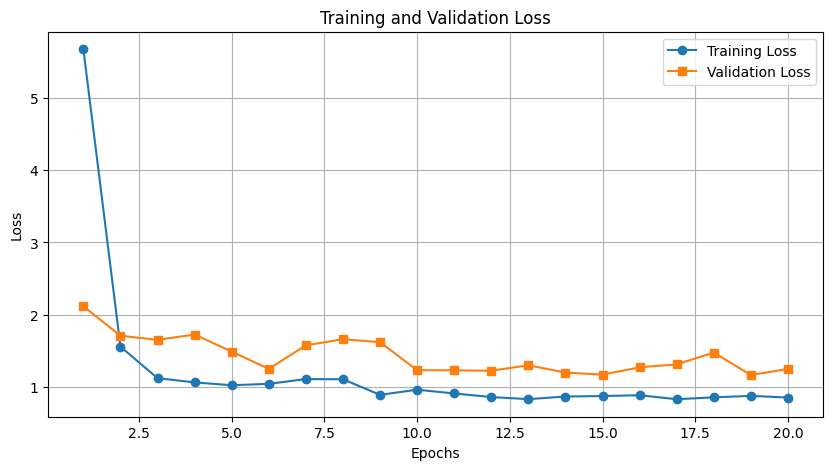

In [ ]:
# Entraîner le modèle
temporal_unet_model = TemporalUNet()
train_model(temporal_unet_model, train_loader, val_loader, num_epochs=20, num_classes=7)

**Test du modèle :**

In [ ]:
def evaluate_model(model, test_loader):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    model.to(device)

    criterion = nn.CrossEntropyLoss()
    test_loss = 0.0

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            loss = criterion(outputs, labels)
            test_loss += loss.item()

    print(f"Test Loss : {test_loss / len(test_loader)}")

In [ ]:
evaluate_model(temporal_unet_model, test_loader)

Test Loss : 0.8770682513713837


**Quelques prédictions :**  

In [ ]:
# Normalisation entre 0 et 1
def normalize(band):
    band_min, band_max = band.min(), band.max()
    return (band - band_min) / (band_max - band_min)

def visualize_predictions(model, dataset, num_samples=5):
    model.eval()
    device = next(model.parameters()).device

    fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 4))


    num_classes = 7
    cmap = plt.get_cmap("tab10", num_classes)

    for i in range(num_samples):
        image, label = dataset[i+20]
        image = image.unsqueeze(0).to(device)  # envoyer sur GPU

        with torch.no_grad():
            output = model(image)
            predicted = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()  # Remettre sur CPU

        rgb_image = image[0, :3].cpu().numpy()


        red_n = normalize(rgb_image[0])
        green_n = normalize(rgb_image[1])
        blue_n = normalize(rgb_image[2])

        # Recomposer l'image normalisée
        rgb_image_norm = np.dstack((red_n, green_n, blue_n))

        axes[i, 0].imshow(rgb_image_norm)
        axes[i, 1].imshow(label, cmap=cmap, vmin=0, vmax=num_classes-1)
        axes[i, 2].imshow(predicted, cmap=cmap, vmin=0, vmax=num_classes-1)

        axes[i, 0].set_title("Image (RGB)")
        axes[i, 1].set_title("Label réel")
        axes[i, 2].set_title("Label prédit")

    plt.tight_layout()
    plt.show()


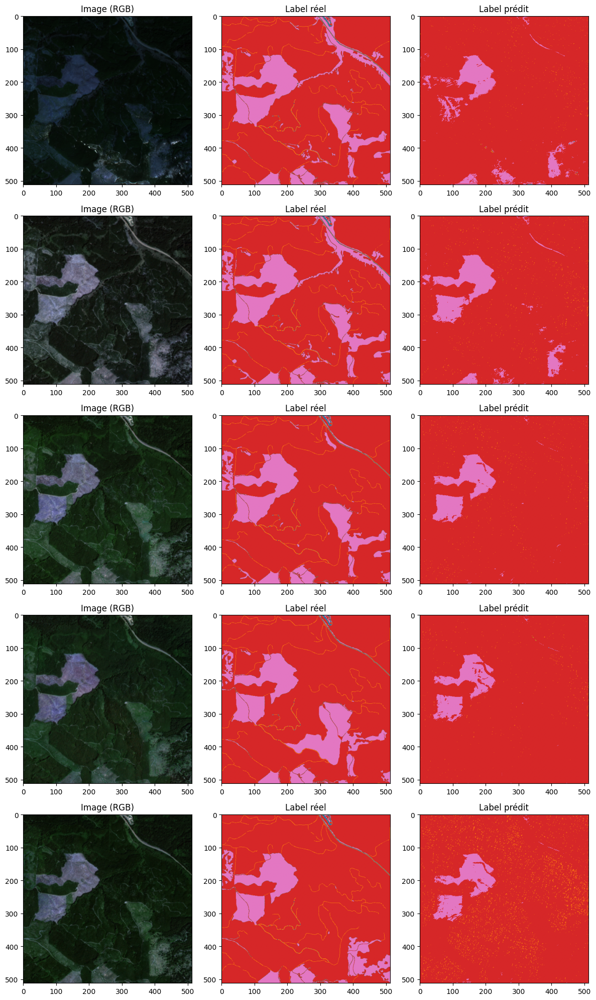

In [ ]:
visualize_predictions(temporal_unet_model, test_dataset)

Interprétation des résultats :

In [ ]:
df_iou, mean_iou = evaluate_iou(temporal_unet_model, test_dataset, num_classes=7)


IoU par classe :
 Classe IoU (%)
      0   0.00%
      1   0.04%
      2  79.04%
      3   0.19%
      4  28.49%
      5  13.92%
      6  55.17%

IoU moyen sur tout le dataset : 25.27%


In [ ]:
df_dice, mean_dice = evaluate_dice(temporal_unet_model, test_dataset, num_classes=7)


DICE coefficient par classe :
 Classe DICE Coefficient (%)
      0                0.01%
      1                0.09%
      2               87.73%
      3                0.37%
      4               39.89%
      5               14.04%
      6               55.17%

Dice moyen sur tout le dataset : 28.19%


Dans leur article, DynamicEarthNet a implémenté son propre U-Net et publié ses résultats ainsi que les conditions d’entraînement. Leur modèle a atteint un IoU de **33.5% sur la validation** et **37.6% sur le test**. Ils ont utilisé l’optimiseur **Adam** avec un **batch size de 4** et un **learning rate de 1e-4**, en s’entraînant sur **100 epochs** avec quatre fois plus de données que nous.

Nos résultats, inférieurs aux leurs, s’expliquent principalement par ces différences dans les conditions d'entraînement. Leur modèle bénéficie d’un dataset plus vaste et d’un entraînement prolongé, ce qui améliore la généralisation.

Si nous avions les capacités d'entraîner notre modèle dans des conditions similaires, avec un dataset plus large et un entraînement plus long, nous pourrions espérer atteindre des performances comparables.

## **Data augmentation**

En explorant différentes sources, notamment *"DATA AUGMENTATION APPROACHES FOR SATELLITE IMAGE SUPER-RESOLUTION"* de M. A. A. Ghaffar et al.– l’un des articles les plus cités sur l’augmentation d’images satellites –, nous avons appris que la data augmentation est largement utilisée pour ces types d’images. L’auteur explique que les approches "instance-based augmentation" (ex : transformations géométriques, modification des couleurs, ajout de bruit, déformation, translation, variation de luminosité et lissage) fonctionnent particulièrement bien.

Dans notre cas, la data augmentation applique des transformations aléatoires (rotation, flips, distorsion) à chaque batch d’images satellites. Cela permet de simuler différentes conditions d’acquisition, d’accroître la diversité des données et d’améliorer la généralisation du modèle, tout en réduisant le risque de surapprentissage.

In [ ]:
import torch
from torch.utils.data import Dataset
import rasterio
import numpy as np
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt

# Normalisation entre 0 et 1
def normalize(band):
       band_min, band_max = band.min(), band.max()
       return (band - band_min) / (band_max - band_min)

class Dataset_Image_Satellite_Augmented(Dataset):
    def __init__(self, image_paths, label_paths, transform=True, target_size=(512, 512)):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.transform = transform
        self.target_size = target_size

        # Transformation pour resize
        self.resize_transform = transforms.Compose([
            transforms.Resize(self.target_size, antialias=True)
        ])

        # Transformation de data augmentation
        self.augmentations = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.3),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.3, rotate_limit=20, p=0.3),
            A.ElasticTransform(alpha=250, sigma=250, p=0.3),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Charger image
        with rasterio.open(self.image_paths[idx]) as src:
            image = src.read([1, 2, 3, 4])  # Charger les 4 canaux
        assert image.shape[0] == 4, f"Image should have 4 channels, but got {image.shape[0]}"
        image = np.moveaxis(image, 0, -1)  # Convertir en (H, W, C)

        # Charger label
        with rasterio.open(self.label_paths[idx]) as src:
            mask = src.read([1, 2, 3, 4, 5, 6, 7])  # (7, H, W)
        assert mask.shape[0] == 7, f"Label should have 7 channels, but got {mask.shape[0]}"
        label = np.argmax(mask, axis=0)  # (H, W)

        # Appliquer les transformations
        image_aug, label_aug = image.copy(), label.copy()
        if self.transform:
            augmented = self.augmentations(image=image, mask=label)
            image = augmented['image']
            label = augmented['mask']
        else:
            image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)  # (C, H, W)
            label = torch.tensor(label, dtype=torch.long)  # (H, W)

        # Resize (512x512)
        label = torch.tensor(label, dtype=torch.long)
        label = self.resize_transform(label.unsqueeze(0)).squeeze(0)
        image = self.resize_transform(image)
        image = torch.tensor(image, dtype=torch.float32)

        # Utiliser seulement pour tester sur 1 image
        '''if idx == 0:
          # Affichage des images : image, image_aug, label, label_aug
          self.display_images(image, image_aug, label, label_aug) '''

        return image, label


    def display_images(self, image, image_aug, mask, mask_aug):
        image = image.permute(1, 2, 0).numpy()  # (H, W, C)
        image = normalize(image[:, :, :3])
        image_aug = normalize(image_aug[:, :, :3])
        mask = mask.numpy()  # (H, W)
        mask_aug = mask_aug  # (H, W)

        # Afficher les images
        plt.figure(figsize=(12, 12))

        plt.subplot(2, 2, 1)
        plt.imshow(image_aug)
        plt.title("Image Originale")
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(image)
        plt.title("Image Augmentée")
        plt.axis('off')

        plt.subplot(2, 2, 3)
        plt.imshow(mask_aug)
        plt.title("Masque Original")
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(mask)
        plt.title("Masque Augmenté")
        plt.axis('off')

        plt.show()



Testons sur 1 image et son label :

<ipython-input-37-723deb848485>:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  label = torch.tensor(label, dtype=torch.long)
<ipython-input-37-723deb848485>:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


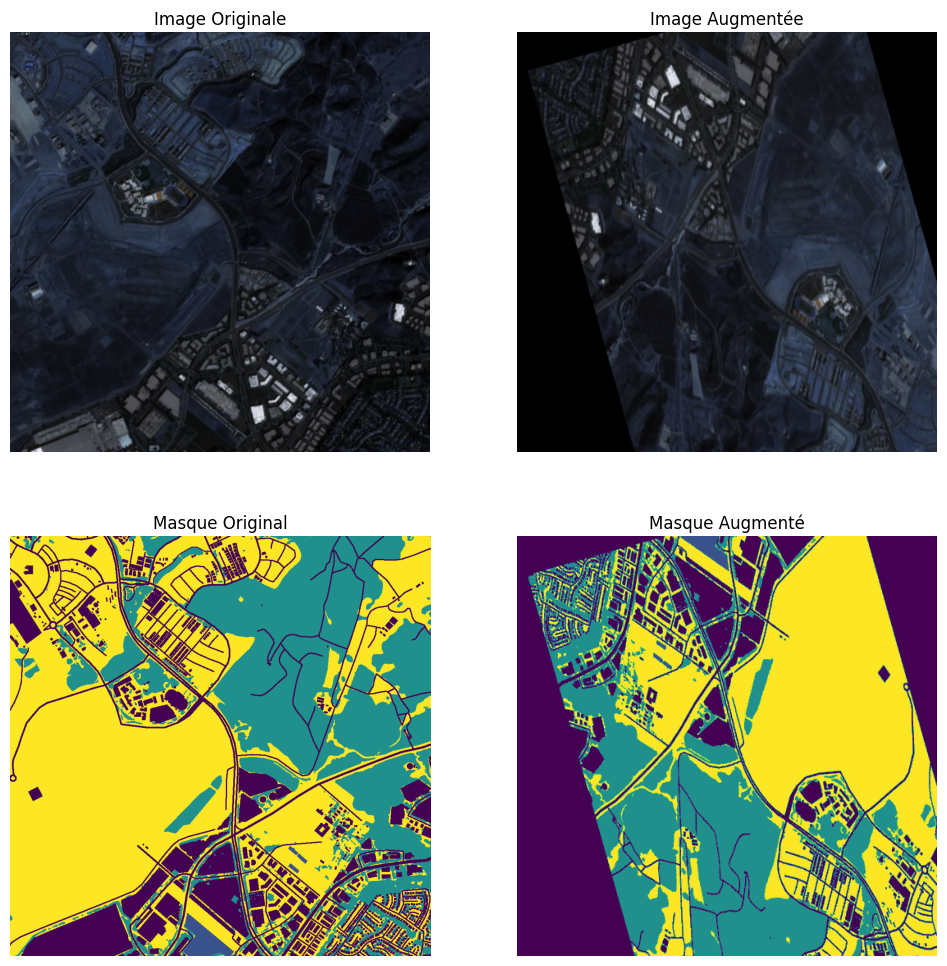

Dataset size: 1


In [ ]:
image_paths = ["/content/drive/My Drive/DynNet/planet.11N/planet/11N/18E-155N/1417_3281_13/PF-SR/2018-01-01.tif"]
label_paths = ["/content/drive/My Drive/DynNet/labels/1417_3281_13_11N/Raster/11N-117W-33N-L3H-SR/11N-117W-33N-L3H-SR-2018_01_01.tif"]

dataset = Dataset_Image_Satellite_Augmented(image_paths, label_paths)

image, mask = dataset[0]

print(f"Dataset size: {len(dataset)}")

In [ ]:
train_dataset_aug = Dataset_Image_Satellite_Augmented(train_images, train_labels)
train_loader_aug = DataLoader(train_dataset_aug, batch_size=8, shuffle=True)

<ipython-input-34-43f390646944>:64: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  label = torch.tensor(label, dtype=torch.long)
<ipython-input-34-43f390646944>:67: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)


Epoch 1/20, Loss : 5.254540963606401
Validation Loss after Epoch 1 : 1.9000797271728516
----------
Epoch 2/20, Loss : 1.4332770271734758
Validation Loss after Epoch 2 : 1.870578898323907
----------
Epoch 3/20, Loss : 1.1861992397091605
Validation Loss after Epoch 3 : 1.737122608555688
----------
Epoch 4/20, Loss : 1.1225437142632224
Validation Loss after Epoch 4 : 1.557131482495202
----------
Epoch 5/20, Loss : 1.004667729139328
Validation Loss after Epoch 5 : 1.6103445291519165
----------
Epoch 6/20, Loss : 1.0758326243270526
Validation Loss after Epoch 6 : 1.54418769147661
----------
Epoch 7/20, Loss : 0.9569796405055306
Validation Loss after Epoch 7 : 1.5750393867492676
----------
Epoch 8/20, Loss : 0.9124822237274863
Validation Loss after Epoch 8 : 1.5589656564924452
----------
Epoch 9/20, Loss : 0.9599286263639276
Validation Loss after Epoch 9 : 1.7075093587239583
----------
Epoch 10/20, Loss : 0.9293870519508015
Validation Loss after Epoch 10 : 1.2572509977552626
----------
Epoch

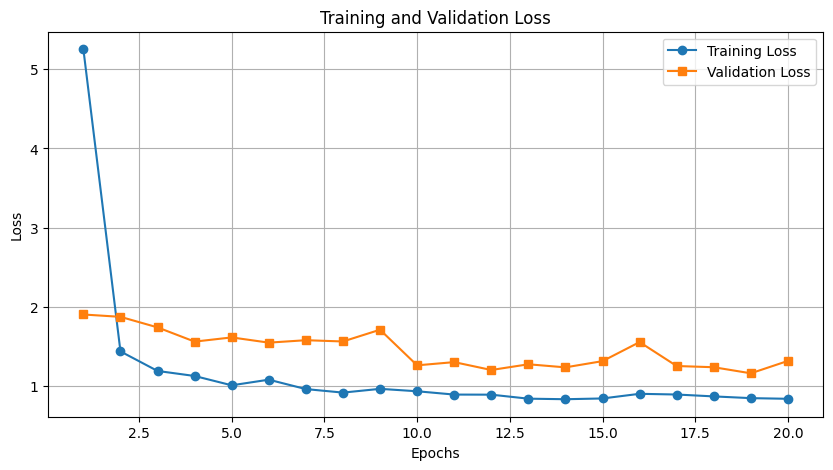

In [ ]:
# Entraîner le modèle
temporal_unet_model_aug = TemporalUNet()
train_model(temporal_unet_model_aug, train_loader_aug, val_loader, num_epochs=20, num_classes=7)

In [ ]:
evaluate_model(temporal_unet_model_aug, test_loader)

Test Loss : 0.851835161447525


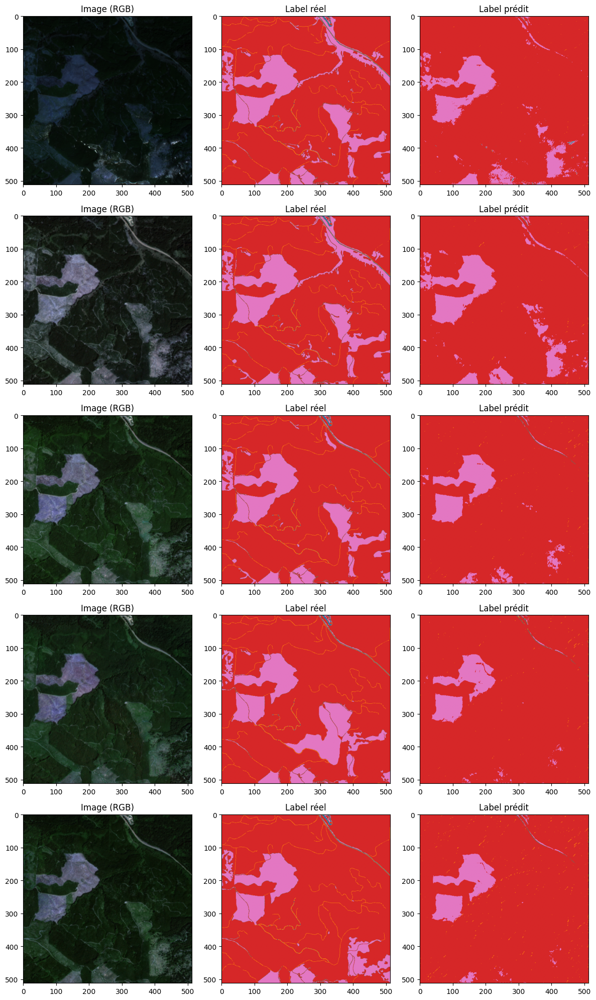

In [ ]:
visualize_predictions(temporal_unet_model_aug, test_dataset)

In [ ]:
df_iou, mean_iou = evaluate_iou(temporal_unet_model_aug, test_dataset, num_classes=7)


IoU par classe :
 Classe IoU (%)
      0   0.07%
      1   0.80%
      2  77.75%
      3   0.35%
      4  24.75%
      5   7.82%
      6  51.72%

IoU moyen sur tout le dataset : 23.32%


In [ ]:
df_dice, mean_dice = evaluate_dice(temporal_unet_model_aug, test_dataset, num_classes=7)


DICE coefficient par classe :
 Classe DICE Coefficient (%)
      0                0.14%
      1                1.57%
      2               86.87%
      3                0.70%
      4               35.77%
      5                8.51%
      6               51.72%

DICE coefficient moyen sur tout le dataset : 26.47%


Nous observons une légère baisse de performance lors de l'entraînement avec data augmentation, avec un IoU passant de 25.27% à 23.32%. Pourtant, les transformations appliquées semblent correctes, comme le confirment les tests visuels sur une image. Cela suggère que certaines augmentations pourraient perturber l’apprentissage plutôt que l’améliorer.

Nous supposons qu'avec seulement 172 images d’entraînement, la data augmentation peut introduire trop de variations, rendant ainsi l’apprentissage instable.

### UNET - RGB ou RGB + NIR

## **Modele pré-entrainé**

### construction modele

In [ ]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

EPOCHS = 15
BATCH_SIZE = 3
LR = 1e-4

Using device: cuda:0


In [ ]:
#voir les classes présentes dans le dataset
def get_present_classes(label_paths):
    all_classes = set()
    for label_path in label_paths:
        with rasterio.open(label_path) as src:
            label_stack = np.stack([src.read(i) for i in range(1, src.count + 1)], axis=-1)
        label_stack = (label_stack == 255).astype(np.uint8)
        present = np.where(np.sum(label_stack, axis=(0, 1)) > 0)[0]
        all_classes.update(present.tolist())
    return sorted(all_classes)

present_classes = get_present_classes(train_labels + val_labels)
num_classes = len(present_classes)
class_map = {orig: new for new, orig in enumerate(present_classes)}
print(f"Classes présentes : {present_classes}")


Classes présentes : [0, 1, 2, 3, 4, 5]


In [ ]:
def get_transform(mode):
    mode = mode.lower()
    if mode == "rgb":
        safe_std = [s if s != 0 else 1e-6 for s in train_std[:3]]
        return transforms.Compose([
            transforms.Normalize(mean=train_mean[:3], std=safe_std)
        ])
    elif mode == "nir":
        safe_std = [train_std[3] if train_std[3] != 0 else 1e-6]
        return transforms.Compose([
            transforms.Normalize(mean=[train_mean[3]], std=safe_std)
        ])
    elif mode == "rgbnir":
      safe_std = [s if s != 0 else 1e-6 for s in train_std[:4]]
      return transforms.Compose([
          transforms.Normalize(mean=train_mean[:4], std=safe_std)
      ])
    else:
        return transforms.Compose([])

In [ ]:
class SegmentationDataset(Dataset):
    def __init__(self, image_paths, label_paths, mode="rgb"):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.mode = mode.lower()
        self.transform = get_transform(self.mode)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        with rasterio.open(self.image_paths[idx]) as src:
            image = src.read().astype(np.float32)
        if self.mode == "rgb":
            image = image[:3]
        elif self.mode == "nir":
            image = image[3:4]
        elif self.mode == "rgbnir":
            image = image[:4]
        image = torch.tensor(image, dtype=torch.float32)
        image = self.transform(image)

        with rasterio.open(self.label_paths[idx]) as src:
            label_stack = np.stack([src.read(i) for i in range(1, src.count + 1)], axis=-1)
        label_stack = (label_stack == 255).astype(np.uint8)
        label = np.argmax(label_stack, axis=-1).astype(np.int64)

        remapped = np.copy(label)
        for orig, new in class_map.items():
            remapped[label == orig] = new
        label = torch.tensor(remapped, dtype=torch.long)
        return image, label

In [ ]:
train_dataset = SegmentationDataset(train_images, train_labels, mode="rgb")
val_dataset = SegmentationDataset(val_images, val_labels, mode="rgb")
test_dataset = SegmentationDataset(test_images, test_labels, mode="rgb")

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
train_dataset_nir = SegmentationDataset(train_images, train_labels, mode="nir")
val_dataset_nir   = SegmentationDataset(val_images, val_labels, mode="nir")
test_dataset_nir  = SegmentationDataset(test_images, test_labels, mode="nir")

train_loader_nir = DataLoader(train_dataset_nir, batch_size=BATCH_SIZE, shuffle=True)
val_loader_nir   = DataLoader(val_dataset_nir, batch_size=BATCH_SIZE, shuffle=False)
test_loader_nir  = DataLoader(test_dataset_nir, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
train_dataset_rgbnir = SegmentationDataset(train_images, train_labels, mode="rgbnir")
val_dataset_rgbnir   = SegmentationDataset(val_images, val_labels, mode="rgbnir")
test_dataset_rgbnir  = SegmentationDataset(test_images, test_labels, mode="rgbnir")

train_loader_rgbnir = DataLoader(train_dataset_rgbnir, batch_size=BATCH_SIZE, shuffle=True)
val_loader_rgbnir   = DataLoader(val_dataset_rgbnir, batch_size=BATCH_SIZE, shuffle=False)
test_loader_rgbnir  = DataLoader(test_dataset_rgbnir, batch_size=BATCH_SIZE, shuffle=False)

Nous avons choisi d'essayer un modele pré-entrainer afin de voir les resultats sur un modele pré-entrainé. Comme nous l'avons mention le U-Net est adapté pour la segmentation d’images grâce à sa structure en encoder-décoder avec des connexions de saut (skip connections) qui permettent de récupérer les détails spatiaux tout en intégrant des informations contextuelles.

Nous avons choisi d'ajouter un backbone EfficientNet-B0 comme encoder, on bénéficie d’un modèle léger et efficace qui a déjà été préentraîné sur ImageNet. Cela permet d’extraire des caractéristiques robustes dès les premières couches, tout en réduisant la charge computationnelle.

Le préentraînement sur ImageNet permet d’utiliser des poids déjà optimisés pour la détection de caractéristiques générales. De plus, en gelant le backbone (freeze_backbone=True), on limite le nombre de paramètres à ajuster durant l’entraînement, ce qui est particulièrement utile lorsque le jeu de données est limité comme c'est le cas ici.

In [ ]:
def get_unet_model(pretrained=True, in_channels=3, num_classes=num_classes, freeze_backbone=False):
    model = smp.Unet(
        encoder_name="efficientnet-b0",
        encoder_weights="imagenet" if pretrained else None,
        in_channels=in_channels,
        classes=num_classes,
    )
    if freeze_backbone:
        for param in model.encoder.parameters():
            param.requires_grad = False
    return model

unet_model = get_unet_model(pretrained=True, in_channels=3, freeze_backbone=True)

In [ ]:
optimizer = optim.Adam(unet_model.parameters(), lr=LR)
loss_fn = nn.CrossEntropyLoss()
scaler = torch.cuda.amp.GradScaler()

<ipython-input-40-2ae6aeaf962b>:3: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [ ]:
def train_model(model, train_loader, val_loader, loss_fn, optimizer, mode="RGB"):
    model.to(DEVICE)
    train_losses = []
    val_losses = []

    for epoch in range(EPOCHS):
        model.train()
        total_loss = 0

        for images, masks in train_loader:
            images, masks = images.to(DEVICE), masks.to(DEVICE)
            optimizer.zero_grad()
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = loss_fn(outputs, masks)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item()

        avg_train_loss = total_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        print(f"[{mode}] Epoch {epoch+1}/{EPOCHS}, Loss: {avg_train_loss:.4f}")

        #partie pour la validation
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(DEVICE), masks.to(DEVICE)
                with torch.cuda.amp.autocast():
                    loss = loss_fn(model(images), masks)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        print(f"[{mode}] Validation Loss: {avg_val_loss:.4f}")

    plt.figure(figsize=(8, 6))
    plt.plot(range(1, EPOCHS + 1), train_losses, label='Training Loss', marker='o')
    plt.plot(range(1, EPOCHS + 1), val_losses, label='Validation Loss', marker='s')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f'Training and Validation Loss ({mode})')
    plt.legend()
    plt.grid(True)
    plt.show()

    return train_losses, val_losses

In [ ]:
def test_model(model, test_loader, loss_fn):
    model.eval()
    test_loss = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(DEVICE), masks.to(DEVICE)
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = loss_fn(outputs, masks)
            test_loss += loss.item()
            preds = torch.argmax(outputs, dim=1).cpu().numpy().flatten()
            labels = masks.cpu().numpy().flatten()
            all_preds.extend(preds.tolist())
            all_labels.extend(labels.tolist())
    avg_loss = test_loss / len(test_loader)
    print(f"Test Loss: {avg_loss:.4f}")


    df_dice, mean_dice = evaluate_dice(model, test_loader.dataset, num_classes)

    return avg_loss, mean_dice


In [ ]:
def accumulate_test_predictions(model, test_loader):
    model.eval()
    all_labels = []
    all_preds = []
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(DEVICE), masks.to(DEVICE)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy().flatten()
            labels = masks.cpu().numpy().flatten()
            all_preds.extend(preds.tolist())
            all_labels.extend(labels.tolist())
    return all_labels, all_preds

In [ ]:
def class_distribution(y_true, y_pred, num_classes):
    unique_true, counts_true = np.unique(y_true, return_counts=True)
    unique_pred, counts_pred = np.unique(y_pred, return_counts=True)

    print("Distribution dans les ground truth:")
    for cls in range(num_classes):
        count = counts_true[unique_true == cls][0] if cls in unique_true else 0
        print(f"  Classe {cls} : {count} pixels")

    print("\nDistribution dans les prédictions:")
    for cls in range(num_classes):
        count = counts_pred[unique_pred == cls][0] if cls in unique_pred else 0
        print(f"  Classe {cls} : {count} pixels")


In [ ]:
def select_samples(model, dataset):
    model.eval()
    best_sample = None
    worst_sample = None
    best_acc = -1
    worst_acc = 2
    with torch.no_grad():
        for i in range(len(dataset)):
            image, gt = dataset[i]
            image_batch = image.unsqueeze(0).to(DEVICE)
            output = model(image_batch)
            pred = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
            gt_np = gt.numpy()
            acc = np.mean(pred == gt_np)
            if acc > best_acc:
                best_acc = acc
                best_sample = (i, gt_np, pred, acc)
            if acc < worst_acc:
                worst_acc = acc
                worst_sample = (i, gt_np, pred, acc)
    return best_sample, worst_sample

def display_sample(sample, title_prefix=""):
    idx, gt, pred, acc = sample
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(gt, cmap=LULC_CMAP, vmin=0, vmax=6)
    axes[0].set_title("Ground Truth")
    axes[0].axis('off')
    axes[1].imshow(pred, cmap=LULC_CMAP, vmin=0, vmax=6)
    axes[1].set_title("Prediction")
    axes[1].axis('off')
    plt.suptitle(f"{title_prefix} Sample (Index {idx}) - Accuracy: {acc*100:.2f}%")
    plt.show()

### Modele sur RGB

<ipython-input-38-da8f0f3719a9>:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[RGB] Epoch 1/15, Loss: 2.0308


<ipython-input-38-da8f0f3719a9>:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[RGB] Validation Loss: 2.7289
[RGB] Epoch 2/15, Loss: 1.6057
[RGB] Validation Loss: 1.3710
[RGB] Epoch 3/15, Loss: 1.4629
[RGB] Validation Loss: 1.1769
[RGB] Epoch 4/15, Loss: 1.3318
[RGB] Validation Loss: 1.0956
[RGB] Epoch 5/15, Loss: 1.2429
[RGB] Validation Loss: 1.0342
[RGB] Epoch 6/15, Loss: 1.1647
[RGB] Validation Loss: 0.9923
[RGB] Epoch 7/15, Loss: 1.2139
[RGB] Validation Loss: 1.0102
[RGB] Epoch 8/15, Loss: 1.1238
[RGB] Validation Loss: 0.9012
[RGB] Epoch 9/15, Loss: 1.0823
[RGB] Validation Loss: 0.9130
[RGB] Epoch 10/15, Loss: 1.0825
[RGB] Validation Loss: 0.9251
[RGB] Epoch 11/15, Loss: 1.0298
[RGB] Validation Loss: 0.8981
[RGB] Epoch 12/15, Loss: 0.9957
[RGB] Validation Loss: 0.8453
[RGB] Epoch 13/15, Loss: 0.9394
[RGB] Validation Loss: 0.8713
[RGB] Epoch 14/15, Loss: 0.9672
[RGB] Validation Loss: 0.7816
[RGB] Epoch 15/15, Loss: 0.9807
[RGB] Validation Loss: 0.8414


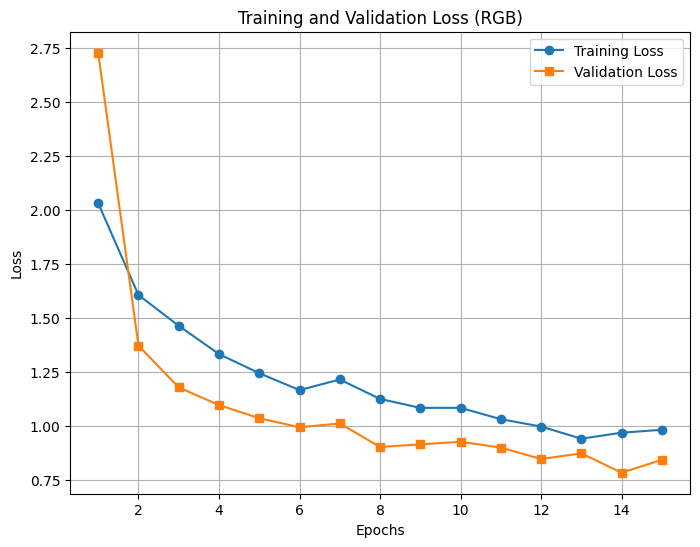

<ipython-input-39-ef3185afb1ef>:9: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Test Loss: 1.0045

DICE coefficient par classe :
 Classe DICE Coefficient (%)
      0               31.91%
      1                1.71%
      2               59.49%
      3               47.37%
      4               58.73%
      5               19.60%

DICE coefficient moyen sur tout le dataset : 36.47%


In [ ]:
train_model(unet_model, train_loader, val_loader, loss_fn, optimizer, mode="RGB")
test_loss, test_dice = test_model(unet_model, test_loader, loss_fn)

Durant les 15 epoques on remarque que les deux pertes diminuent : la perte d’entraînement passe de 2,03 à 0,98 et la perte de validation de 2,72 à 0,84, sans signe majeur de surapprentissage (la perte de validation ne se met pas à augmenter pendant qye celle de l'entraînement continue de baisser). On commence à noter peut-être un leger sur-apprentissage à l'epoque 14, il faudra reduire peut etre.

La perte finale sur le test est de 1,00, légèrement supérieure à la perte de validation (0,84), ce qui reste cohérent.


Le DICE moyen est de 36,47 %. Certaines classes sont mieux segmentées (classe 2 à 59,49 %, classe 4 à 58,73 %) qui sont comme on l'a vu dans la phase d'exploration bien représenté dans le dataset, tandis que d’autres restent mal détectées (classe 1 à 1,71 %, classe 5 à 19,60 %), moins représenté dans le dataset.


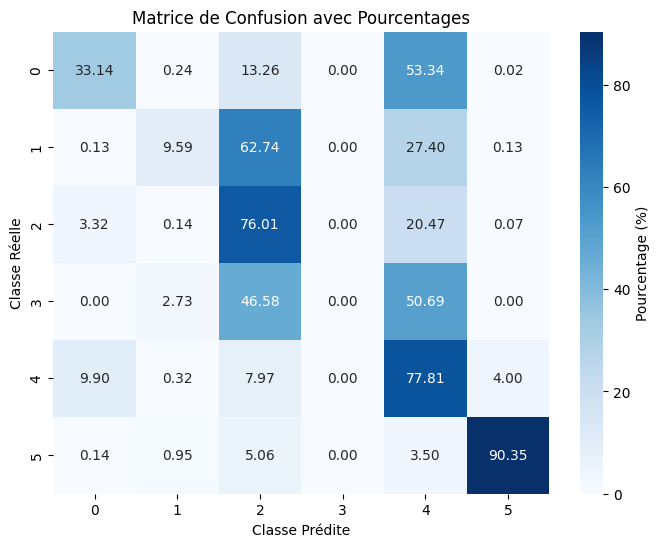

In [ ]:
y_true, y_pred = accumulate_test_predictions(unet_model, test_loader)
plot_confusion_matrix(y_true, y_pred, num_classes)


In [ ]:
class_distribution(np.array(y_true), np.array(y_pred), num_classes)


Distribution dans les ground truth:
  Classe 0 : 4136420 pixels
  Classe 1 : 1422046 pixels
  Classe 2 : 5603866 pixels
  Classe 3 : 6932 pixels
  Classe 4 : 6302064 pixels
  Classe 5 : 2451616 pixels

Distribution dans les prédictions:
  Classe 0 : 2185660 pixels
  Classe 1 : 197980 pixels
  Classe 2 : 6329886 pixels
  Classe 3 : 15 pixels
  Classe 4 : 8735827 pixels
  Classe 5 : 2473576 pixels


Dans notre analyse, nous constatons d’importantes disparités entre la distribution des pixels, et ces différences se voient de manière distincte dans la matrice de confusion et dans le coefficient DICE. La matrice de confusion met en évidence les effectifs absolus et les erreurs de classification entre classes, tandis que le coefficient DICE se focalise sur le recouvrement proportionnel entre les prédictions et le ground truth.

Pour la classe 0, le ground truth comporte environ 4,1 millions de pixels, alors que le modèle ne prédit qu’environ 2,18 millions. Cela indique que de nombreux pixels réels de la classe 0 sont mal classés et réassignés à d’autres classes Néanmoins, le coefficient DICE peut rester modéré voire acceptable pour cette classe si le recouvrement relatif (l’intersection) entre la zone prédite et la zone réelle est suffisamment élevé, même si le nombre absolu de pixels corrects est réduit.

Concernant la classe 1, le ground truth affiche environ 1,42 million de pixels tandis que le modèle n’en prédit qu’environ 198 000. Le modèle sous-prédit donc fortement cette classe, ce qui se traduit dans la matrice de confusion par une diagonale très faible pour la classe 1. Le calcul du DICE, reflete l’échec du modèle à détecter correctement cette catégorie.

Pour la classe 2, on observe environ 5,60 millions de pixels dans le ground truth contre environ 6,33 millions dans les prédictions. Ici, le modèle a tendance à sur-prédire la classe 2, ce qui se traduit dans la matrice par une confusion où des pixels appartenant en réalité à d’autres classes (comme 0, 1, 4 ou 5) sont classés à tort comme 2.

La classe 3 est particulièrement problématique : elle ne compte que 6 932 pixels dans le ground truth et seulement 15 pixels sont prédits. En conséquence, la matrice de confusion affiche pratiquement une ligne et une colonne vides pour cette classe. Cependant, si le coefficient DICE n’est pas nul, cela signifie que, malgré le faible nombre absolu, le recouvrement proportionnel entre les zones prédite et réelles est suffisamment correct pour générer un score non négligeable.

Pour la classe 4, le ground truth indique environ 6,30 millions de pixels, tandis que le modèle prédit environ 8,74 millions, il y a une suprediction importante. La matrice de confusion montre de nombreuses erreurs, avec des pixels réels appartenant à des classes telles que 0, 1 ou 3 étant incorrectement classés comme 4. Néanmoins, le DICE pour la classe 4 peut rester correct si une part importante des pixels réels est correctement identifiée.

Enfin, pour la classe 5, le nombre de pixels est assez équilibré entre ground truth (env 2,45 millions) et prédictions (env 2,47 millions). Si beaucoup de pixels réels de la classe 5 sont confondus avec d’autres classes , le DICE sera faible.


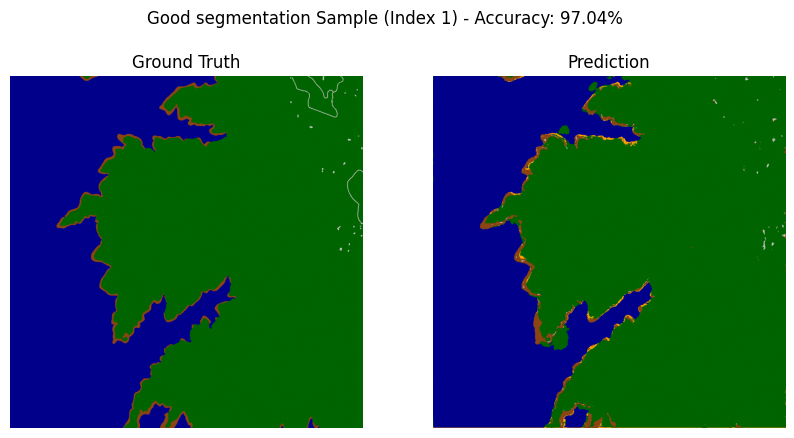

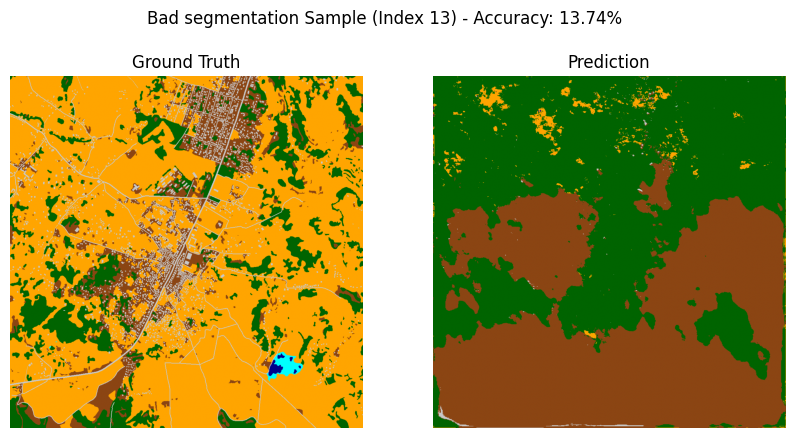

In [ ]:
best, worst = select_samples(unet_model, test_dataset)
display_sample(best, title_prefix="Good segmentation")
display_sample(worst, title_prefix="Bad segmentation")

on remarque de très mauvais resultat sur la deuxieme image qui s'explique surment par le fait que la classe 3 (agriculture en orange) est très peu representée de base dans le dataset, ce qui vient attester de ce qui a été dit plus haut.

### Modele sur NIR

<ipython-input-38-da8f0f3719a9>:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[NIR] Epoch 1/15, Loss: 1.7185


<ipython-input-38-da8f0f3719a9>:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[NIR] Validation Loss: 3.4669
[NIR] Epoch 2/15, Loss: 1.5262
[NIR] Validation Loss: 1.6829
[NIR] Epoch 3/15, Loss: 1.4010
[NIR] Validation Loss: 1.4031
[NIR] Epoch 4/15, Loss: 1.3196
[NIR] Validation Loss: 1.1674
[NIR] Epoch 5/15, Loss: 1.2787
[NIR] Validation Loss: 1.0987
[NIR] Epoch 6/15, Loss: 1.2156
[NIR] Validation Loss: 1.0067
[NIR] Epoch 7/15, Loss: 1.2042
[NIR] Validation Loss: 0.9656
[NIR] Epoch 8/15, Loss: 1.1429
[NIR] Validation Loss: 0.9285
[NIR] Epoch 9/15, Loss: 1.1653
[NIR] Validation Loss: 0.9313
[NIR] Epoch 10/15, Loss: 1.1155
[NIR] Validation Loss: 0.9218
[NIR] Epoch 11/15, Loss: 1.1082
[NIR] Validation Loss: 0.8729
[NIR] Epoch 12/15, Loss: 1.0866
[NIR] Validation Loss: 0.8792
[NIR] Epoch 13/15, Loss: 1.0382
[NIR] Validation Loss: 0.8552
[NIR] Epoch 14/15, Loss: 1.0683
[NIR] Validation Loss: 0.8440
[NIR] Epoch 15/15, Loss: 1.0326
[NIR] Validation Loss: 0.9310


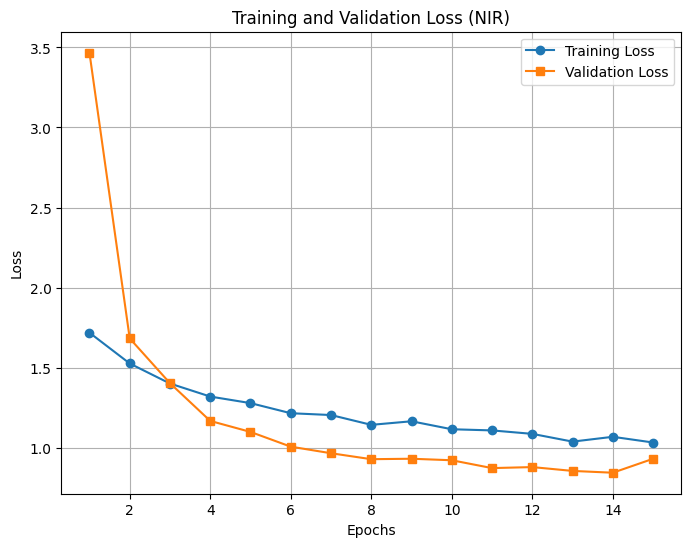

<ipython-input-39-ef3185afb1ef>:9: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Test Loss: 1.0001

DICE coefficient par classe :
 Classe DICE Coefficient (%)
      0                8.02%
      1                2.32%
      2               56.71%
      3               73.68%
      4               55.30%
      5               30.19%

DICE coefficient moyen sur tout le dataset : 37.71%


In [ ]:
unet_model_nir = get_unet_model(pretrained=True, in_channels=1, freeze_backbone=True)
optimizer_nir = optim.Adam(unet_model_nir.parameters(), lr=LR)

train_model(unet_model_nir, train_loader_nir, val_loader_nir, loss_fn, optimizer_nir, mode="NIR")
test_loss_nir, test_dice_nir = test_model(unet_model_nir, test_loader_nir, loss_fn)

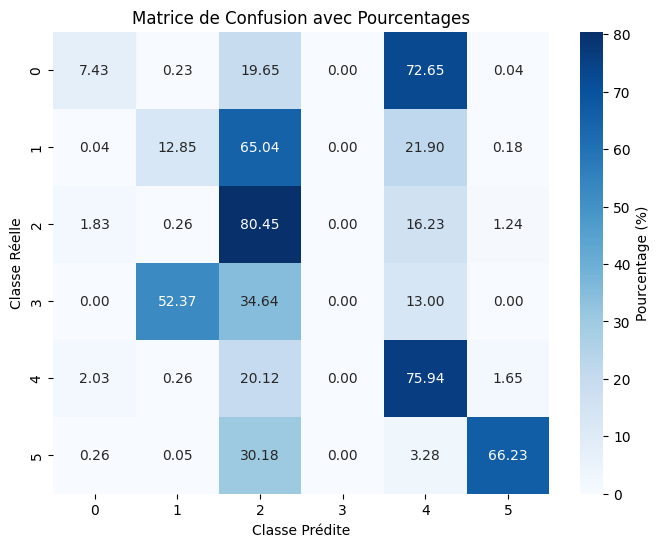

In [ ]:
y_true_NIR, y_pred_NIR = accumulate_test_predictions(unet_model_nir, test_loader_nir)
plot_confusion_matrix(y_true_NIR, y_pred_NIR, num_classes)


In [ ]:
class_distribution(np.array(y_true_NIR), np.array(y_pred_NIR), num_classes)

Distribution dans les ground truth:
  Classe 0 : 4136420 pixels
  Classe 1 : 1422046 pixels
  Classe 2 : 5603866 pixels
  Classe 3 : 6932 pixels
  Classe 4 : 6302064 pixels
  Classe 5 : 2451616 pixels

Distribution dans les prédictions:
  Classe 0 : 544676 pixels
  Classe 1 : 227999 pixels
  Classe 2 : 8255840 pixels
  Classe 3 : 3 pixels
  Classe 4 : 9093080 pixels
  Classe 5 : 1801346 pixels


Le modèle NIR a une diminution plus importante de sa perte avec une perte de validation initialement très élevée (3,47), qui redescend rapidement puis atteint autour de 0,93 en fin d’entraînement. Mais il finit par converger vers une performance de test similaire à celle du modèle RGB (test loss proche de 1,0).

Pour les classes, le modèle NIR détecte nettement mieux la classe 3, malgré le très faible nombre de pixels concernés, et obtient un DICE supérieur à 70 % contre environ 47 % pour le modèle RGB. À l’inverse, il sous-prédit massivement la classe 0 ce qui se traduit par un DICE d’à peine 8 %. Le modèle RGB, quant à lui, couvre mieux la classe 0 (plus de 2 millions de pixels prédits), même si son DICE demeure loin d’être parfait. Les deux approches échouent de manière similaire pour la classe 1, largement sous-prédites dans les deux cas et aboutissant à un DICE très faible. Les classes 2 et 4, en revanche, sont toutes deux sur-prédites, que l’on utilise le canal infrarouge seul ou le triplet RGB, ce qui maintient des DICE supérieurs à 50 %.

le DICE moyen reste relativement proche entre les deux approches (36,47 % en RGB et 37,71 % en NIR), et la perte finale de test se situe aux alentours de 1. Aucun des deux modèles ne parvient à couvrir toutes les catégories de manière satisfaisante. On peut ainsi conclure que, bien que l’infrarouge permette une meilleure identification de certaines classes peu fréquentes (comme la classe 3), le RGB reste plus équilibré pour les classes plus massives (comme la classe 0). Il est donc interessant de les combiner pour voir le resultat

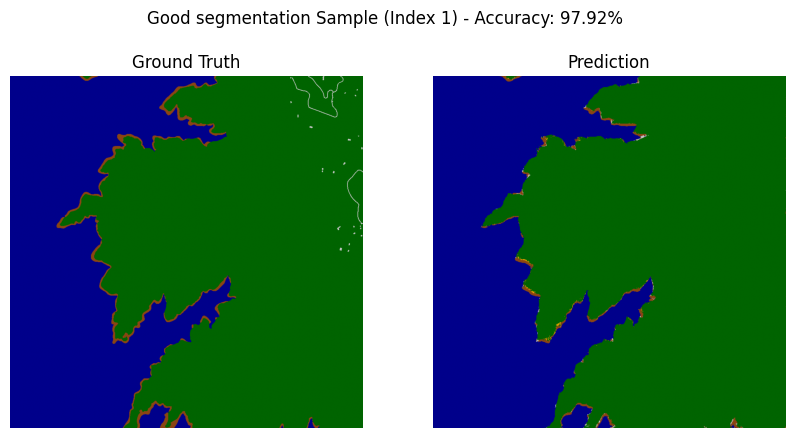

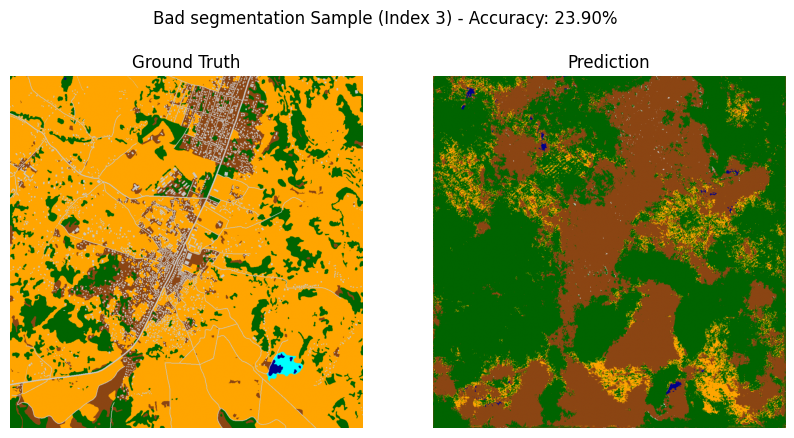

In [ ]:
best, worst = select_samples(unet_model_nir, test_dataset_nir)
display_sample(best, title_prefix="Good segmentation")
display_sample(worst, title_prefix="Bad segmentation")

Ces images traduisent là encore les différence. on remqraue ici que les terres agricoles sont biens mieux identifiées par exemple

### Modele sur NIR+RGB

<ipython-input-38-da8f0f3719a9>:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[RGB+NIR] Epoch 1/15, Loss: 1.8537


<ipython-input-38-da8f0f3719a9>:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[RGB+NIR] Validation Loss: 2.8240
[RGB+NIR] Epoch 2/15, Loss: 1.6355
[RGB+NIR] Validation Loss: 1.4096
[RGB+NIR] Epoch 3/15, Loss: 1.4934
[RGB+NIR] Validation Loss: 1.2917
[RGB+NIR] Epoch 4/15, Loss: 1.3902
[RGB+NIR] Validation Loss: 1.2419
[RGB+NIR] Epoch 5/15, Loss: 1.3022
[RGB+NIR] Validation Loss: 1.1201
[RGB+NIR] Epoch 6/15, Loss: 1.2326
[RGB+NIR] Validation Loss: 1.0696
[RGB+NIR] Epoch 7/15, Loss: 1.1971
[RGB+NIR] Validation Loss: 0.9379
[RGB+NIR] Epoch 8/15, Loss: 1.1869
[RGB+NIR] Validation Loss: 0.9350
[RGB+NIR] Epoch 9/15, Loss: 1.0715
[RGB+NIR] Validation Loss: 0.8915
[RGB+NIR] Epoch 10/15, Loss: 1.1052
[RGB+NIR] Validation Loss: 0.8647
[RGB+NIR] Epoch 11/15, Loss: 1.0891
[RGB+NIR] Validation Loss: 0.7923
[RGB+NIR] Epoch 12/15, Loss: 1.0251
[RGB+NIR] Validation Loss: 0.8184
[RGB+NIR] Epoch 13/15, Loss: 0.9873
[RGB+NIR] Validation Loss: 0.8007
[RGB+NIR] Epoch 14/15, Loss: 0.9533
[RGB+NIR] Validation Loss: 0.8033
[RGB+NIR] Epoch 15/15, Loss: 0.9666
[RGB+NIR] Validation Loss: 0

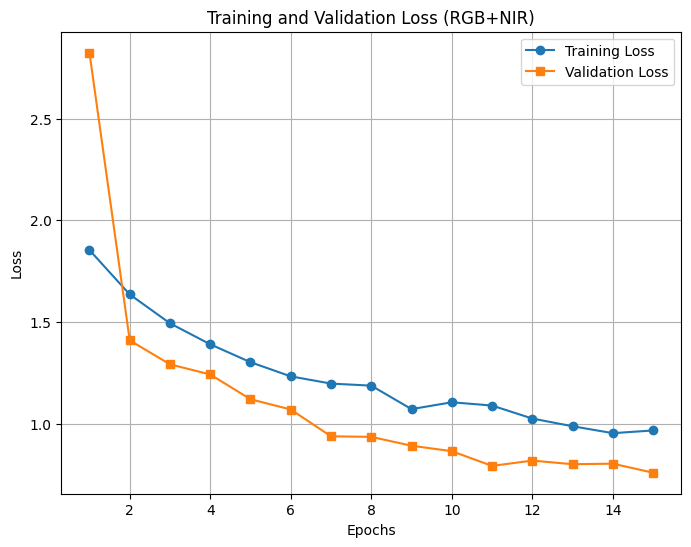

<ipython-input-39-ef3185afb1ef>:9: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Test Loss: 0.8894

DICE coefficient par classe :
 Classe DICE Coefficient (%)
      0               42.07%
      1               10.96%
      2               60.83%
      3               84.21%
      4               51.42%
      5               35.61%

DICE coefficient moyen sur tout le dataset : 47.52%


In [ ]:
unet_model_rgbnir = get_unet_model(pretrained=True, in_channels=4, freeze_backbone=True)
optimizer_rgbnir = optim.Adam(unet_model_rgbnir.parameters(), lr=LR)

train_model(unet_model_rgbnir, train_loader_rgbnir, val_loader_rgbnir, loss_fn, optimizer_rgbnir, mode="RGB+NIR")
test_loss_rgbnir, test_dice_rgbnir = test_model(unet_model_rgbnir, test_loader_rgbnir, loss_fn)

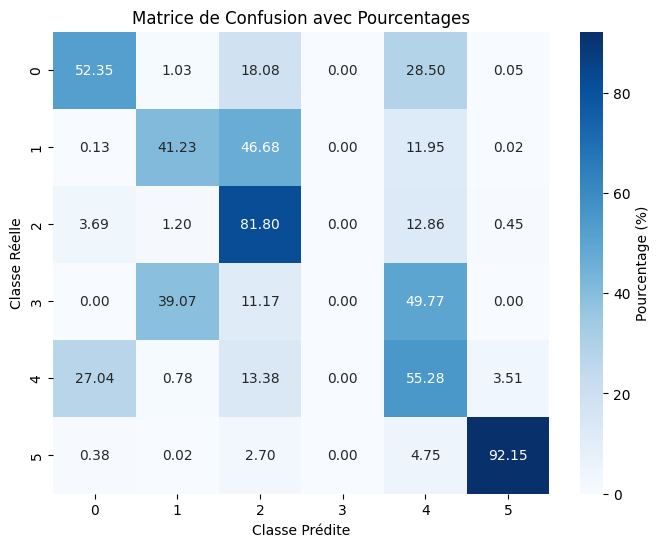

In [ ]:
y_true_NIRRGB, y_pred_NIRRGB = accumulate_test_predictions(unet_model_rgbnir, test_loader_rgbnir)
plot_confusion_matrix(y_true_NIRRGB, y_pred_NIRRGB, num_classes)

In [ ]:
class_distribution(np.array(y_true_NIRRGB), np.array(y_pred_NIRRGB), num_classes)

Distribution dans les ground truth:
  Classe 0 : 4136420 pixels
  Classe 1 : 1422046 pixels
  Classe 2 : 5603866 pixels
  Classe 3 : 6932 pixels
  Classe 4 : 6302064 pixels
  Classe 5 : 2451616 pixels

Distribution dans les prédictions:
  Classe 0 : 4087513 pixels
  Classe 1 : 748356 pixels
  Classe 2 : 6906195 pixels
  Classe 3 : 1 pixels
  Classe 4 : 5672742 pixels
  Classe 5 : 2508137 pixels


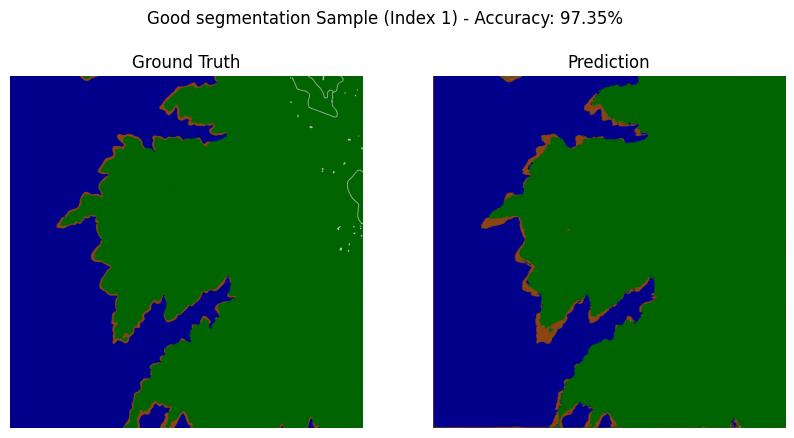

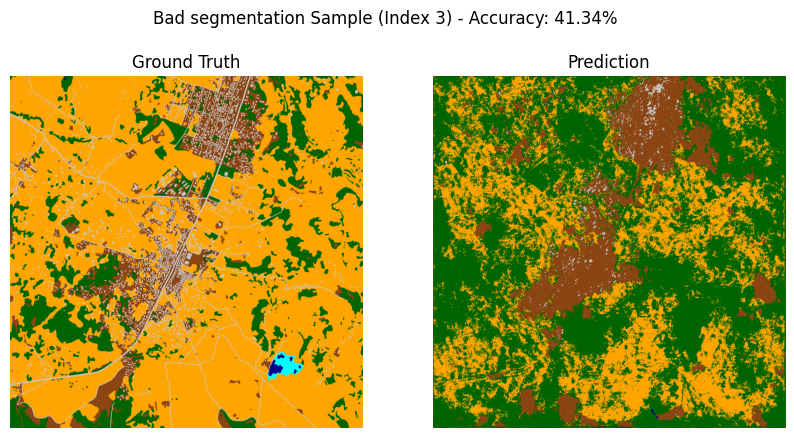

In [ ]:
best, worst = select_samples(unet_model_rgbnir, test_dataset_rgbnir)
display_sample(best, title_prefix="Good segmentation")
display_sample(worst, title_prefix="Bad segmentation")

Le dice moyen s’élève à 47,52 %, nettement supérieur a env 36-38 % obtenus en RGB ou en NIR. La classe 3, notamment, atteint un DICE de 84,21 %, alors qu’elle restait autour de 47 % en RGB et 73 % en NIR. De plus, la classe 1, très mal détectée par les deux modèles précédents, atteint ici près de 11 %, il y a une meilleure capacité à reconnaître cette classe minoritaire.

Mais la distribution des prédictions montre quelques incohérences par exemple : la classe 3, n’est prédite qu’à un seul pixel, ce qui suggère un fort déséquilibre dans la segmentation, malgré le bon DICE. Les classes 0, 2 et 5, quant à elles, sont globalement mieux réparties, la classe 2 étant sur-prédite comme dans les approches précédentes, mais le recouvrement reste meilleur (DICE de 60,83 %).

La combinaison des canaux RGB et NIR apporte un gain global de performance, tout en conservant certaines limites liées aux classes rares et aux confusions persistantes avec les classes majoritaires. POur reduire ceka nous allons essayer faire une augmentation de données.

### Modele NIR + RGB Data augmentation

In [ ]:
class AugmentedSegmentationDataset(Dataset):
    def __init__(self, image_paths, label_paths, mode="rgbnir", augment=True,
                 target_size=(512, 512), normalization_transform=None, class_map=None):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.mode = mode.lower()
        self.augment = augment
        self.target_size = target_size
        self.normalization_transform = normalization_transform
        self.class_map = class_map

        self.augmentations = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.3),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.3, rotate_limit=20, p=0.3),
            A.ElasticTransform(alpha=250, sigma=250, p=0.3),
            A.Resize(self.target_size[0], self.target_size[1]),
            ToTensorV2()
        ])
        self.resize_only = A.Compose([
            A.Resize(self.target_size[0], self.target_size[1]),
            ToTensorV2()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
      with rasterio.open(self.image_paths[idx]) as src:
          if self.mode == "rgb":
              image = src.read([1, 2, 3])
          elif self.mode == "nir":
              image = src.read([4])
          elif self.mode == "rgbnir":
              image = src.read([1, 2, 3, 4])
          else:
              image = src.read()
      image = np.moveaxis(image, 0, -1)

      with rasterio.open(self.label_paths[idx]) as src:
          label_stack = np.stack([src.read(i) for i in range(1, 8)], axis=-1)
      label_stack = (label_stack == 255).astype(np.uint8)
      label = np.argmax(label_stack, axis=-1)

      if self.class_map is not None:
          remapped = np.copy(label)
          for orig, new in self.class_map.items():
              remapped[label == orig] = new
          label = remapped

      if self.augment:
          augmented = self.augmentations(image=image, mask=label)
      else:
          augmented = self.resize_only(image=image, mask=label)

      image = augmented['image']
      image = image.float()

      label = augmented['mask'].clone().detach().long()

      if self.normalization_transform is not None:
          image = self.normalization_transform(image)

      return image, label

train_dataset_rgbnir_aug = AugmentedSegmentationDataset(
    train_images, train_labels,
    mode="rgbnir",
    augment=True,
    target_size=(512, 512),
    normalization_transform=get_transform("rgbnir"),
    class_map=class_map
)
val_dataset_rgbnir_aug = AugmentedSegmentationDataset(
    val_images, val_labels,
    mode="rgbnir",
    augment=False,
    target_size=(512, 512),
    normalization_transform=get_transform("rgbnir"),
    class_map=class_map
)
test_dataset_rgbnir_aug = AugmentedSegmentationDataset(
    test_images, test_labels,
    mode="rgbnir",
    augment=False,
    target_size=(512, 512),
    normalization_transform=get_transform("rgbnir"),
    class_map=class_map
)

train_loader_rgbnir_aug = DataLoader(train_dataset_rgbnir_aug, batch_size=BATCH_SIZE, shuffle=True)
val_loader_rgbnir_aug   = DataLoader(val_dataset_rgbnir_aug, batch_size=BATCH_SIZE, shuffle=False)
test_loader_rgbnir_aug  = DataLoader(test_dataset_rgbnir_aug, batch_size=BATCH_SIZE, shuffle=False)




<ipython-input-41-da8f0f3719a9>:13: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[RGB+NIR] Epoch 1/15, Loss: 1.9565


<ipython-input-41-da8f0f3719a9>:31: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


[RGB+NIR] Validation Loss: 2.1566
[RGB+NIR] Epoch 2/15, Loss: 1.6634
[RGB+NIR] Validation Loss: 1.4500
[RGB+NIR] Epoch 3/15, Loss: 1.5762
[RGB+NIR] Validation Loss: 1.2728
[RGB+NIR] Epoch 4/15, Loss: 1.4545
[RGB+NIR] Validation Loss: 1.2124
[RGB+NIR] Epoch 5/15, Loss: 1.3697
[RGB+NIR] Validation Loss: 1.1128
[RGB+NIR] Epoch 6/15, Loss: 1.3285
[RGB+NIR] Validation Loss: 1.0907
[RGB+NIR] Epoch 7/15, Loss: 1.3232
[RGB+NIR] Validation Loss: 1.0950
[RGB+NIR] Epoch 8/15, Loss: 1.2821
[RGB+NIR] Validation Loss: 1.0091
[RGB+NIR] Epoch 9/15, Loss: 1.2474
[RGB+NIR] Validation Loss: 1.0095
[RGB+NIR] Epoch 10/15, Loss: 1.2732
[RGB+NIR] Validation Loss: 0.9642
[RGB+NIR] Epoch 11/15, Loss: 1.2009
[RGB+NIR] Validation Loss: 0.9393
[RGB+NIR] Epoch 12/15, Loss: 1.1840
[RGB+NIR] Validation Loss: 0.9276
[RGB+NIR] Epoch 13/15, Loss: 1.1318
[RGB+NIR] Validation Loss: 0.9098
[RGB+NIR] Epoch 14/15, Loss: 1.1287
[RGB+NIR] Validation Loss: 0.8918
[RGB+NIR] Epoch 15/15, Loss: 1.1445
[RGB+NIR] Validation Loss: 0

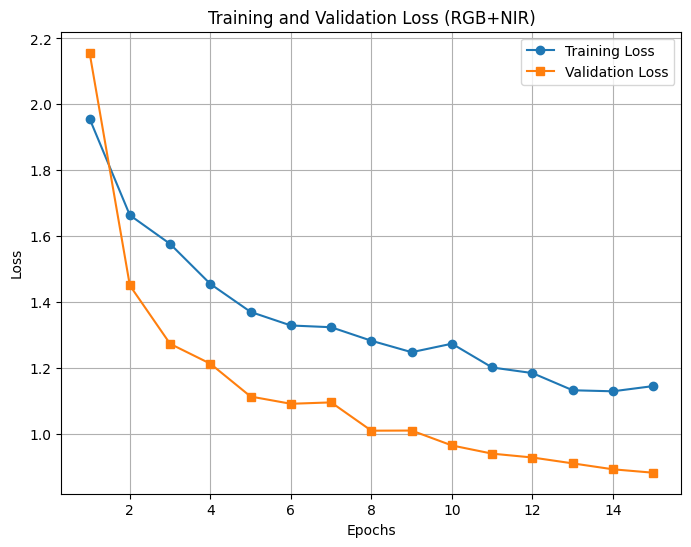

([1.95650273247769,
  1.663380371896844,
  1.576188507832979,
  1.4545478224754333,
  1.369654473505522,
  1.3284658977859898,
  1.3232155677519346,
  1.282127868188055,
  1.2473834972632558,
  1.2731927915623313,
  1.2009434182392924,
  1.1839577179206044,
  1.1317787264522754,
  1.1286598538097583,
  1.1444913384161497],
 [2.1566469430923463,
  1.4500172138214111,
  1.2728328824043273,
  1.2123982906341553,
  1.1127537161111831,
  1.0907425165176392,
  1.0949805140495301,
  1.0090665012598037,
  1.0094659090042115,
  0.9642124325037003,
  0.9393267124891281,
  0.9276422649621964,
  0.9098143488168716,
  0.8918353110551834,
  0.8814338684082031])

In [ ]:
unet_model_rgbnir_aug = get_unet_model(pretrained=True, in_channels=4, freeze_backbone=True)
optimizer_rgbnir_aug = optim.Adam(unet_model_rgbnir_aug.parameters(), lr=LR)

train_model(unet_model_rgbnir_aug, train_loader_rgbnir_aug, val_loader_rgbnir_aug, loss_fn, optimizer_rgbnir_aug, mode="RGB+NIR")


In [ ]:
test_loss_rgbnir_aug, test_dice_rgbnir_aug = test_model(unet_model_rgbnir_aug, test_loader_rgbnir_aug, loss_fn)

<ipython-input-42-ef3185afb1ef>:9: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Test Loss: 0.8017

DICE coefficient par classe :
 Classe DICE Coefficient (%)
      0                8.64%
      1                4.05%
      2               66.13%
      3               36.00%
      4               44.97%
      5               40.32%

DICE coefficient moyen sur tout le dataset : 33.35%


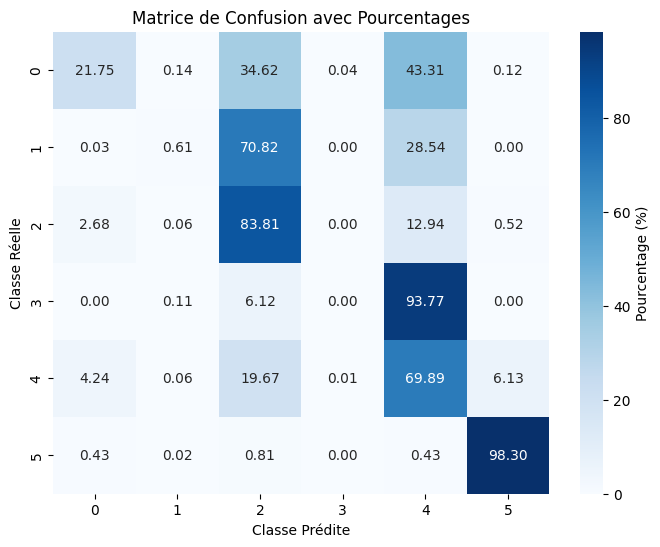

In [ ]:
y_true_NIRRGB_aug, y_pred_NIRRGB_aug = accumulate_test_predictions(unet_model_rgbnir_aug, test_loader_rgbnir_aug)
plot_confusion_matrix(y_true_NIRRGB_aug, y_pred_NIRRGB_aug, num_classes)

In [ ]:
class_distribution(np.array(y_true_NIRRGB_aug), np.array(y_pred_NIRRGB_aug), num_classes)

Distribution dans les ground truth:
  Classe 0 : 571575 pixels
  Classe 1 : 177835 pixels
  Classe 2 : 2997676 pixels
  Classe 3 : 899 pixels
  Classe 4 : 1798397 pixels
  Classe 5 : 1007218 pixels

Distribution dans les prédictions:
  Classe 0 : 285279 pixels
  Classe 1 : 4910 pixels
  Classe 2 : 3198160 pixels
  Classe 3 : 437 pixels
  Classe 4 : 1948190 pixels
  Classe 5 : 1116624 pixels


Contrairement au modèle RGB+NIR sans data augmentation, qui affichait un test loss approximativement 0,88–0,89 pour un DICE moyen d’environ 47 %, la version RGB+NIR avec augmentation obtient un test loss plus bas (0,80), mais un DICE moyen plus faible (33%). Cette amélioration de la perte globale s’explique par une meilleure segmentation des classes majoritaires (ex : la classe 2), tandis que les classes 0 et 1, moins fréquentes, restent largement sous-prédites, ce qui dégrade la moyenne du DICE.

La data augmentation aide le réseau à mieux généraliser sur certains aspects, comme la reconnaissance de la classe 3 (rare), ou à réduire le surapprentissage. Cependant, l’entraînement n’est pas pondéré en faveur des classes peu représentées, et la fonction de perte (CrossEntropy) se trouve dominée par les classes majoritaires donc c'est pour cela qu'on observe cette différence entre la diminution de la perte (mieux pour les classes nombreuses) et la baisse du DICE moyen (pénalisé par les erreurs sur les classes rares).

Une eventualisté serait judicieux de combiner la data augmentation avec des stratégies comme la pondération de la loss ou un oversampling des classes peu présentes, afin de renforcer la détection de classes 0 et 1 et d’obtenir un meilleur équilibre entre la réduction de la perte et l’amélioration globale du DICE.

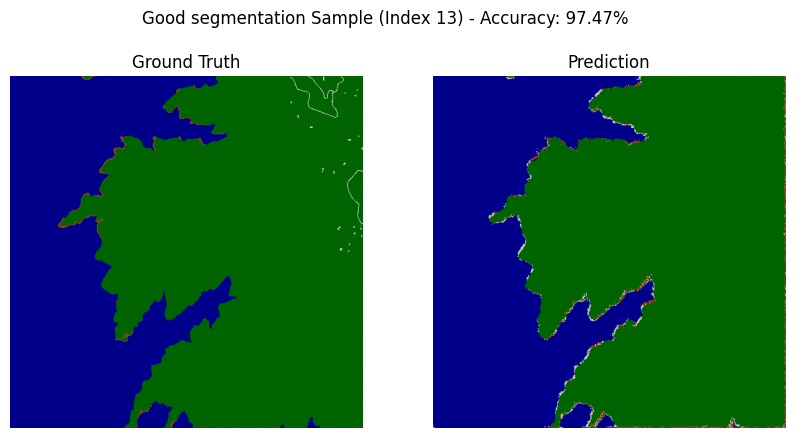

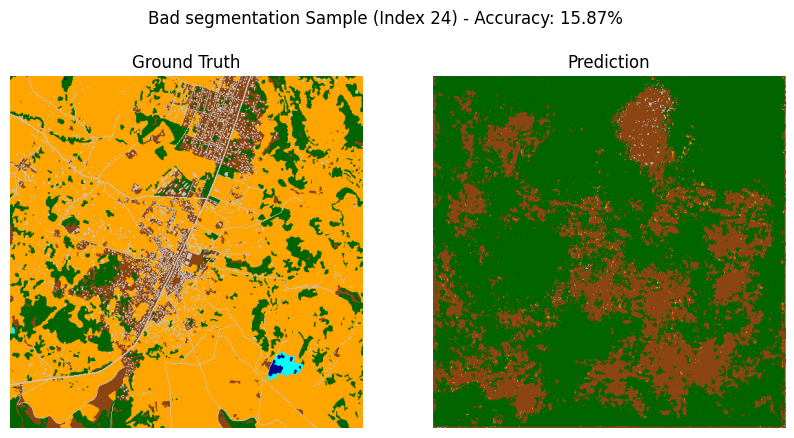

In [ ]:
best, worst = select_samples(unet_model_rgbnir_aug, test_dataset_rgbnir_aug)
display_sample(best, title_prefix="Good segmentation")
display_sample(worst, title_prefix="Bad segmentation")

# **Conclusion**

Ce travail a permis de développer et d’évaluer un **U-Net** pour la *segmentation d’images satellites* en explorant différentes approches d'entraînement. Nous avons comparé un **U-Net entraîné from scratch**, avec et sans **data augmentation**, ainsi qu’un **modèle pré-entraîné**, en testant différentes combinaisons de bandes spectrales (RGB seul vs. RGB + NIR) et avec de la data augmentation.

En conclusion, nos résultats restent cohérents au regard des ressources limitées utilisées pour entraîner nos modèles. Nous sommes convaincus que nos solutions pourraient gagner en performance avec davantage de mémoire et de puissance de calcul. Si à l'avenir Télécom Paris offre la possibilité d’accéder à des GPUs, nous serions très contentes à l’idée de tester nos modèles dans un environnement plus optimisé !

# **Références**

1. Ronneberger, O., Fischer, P., & Brox, T. (2015). **U-Net: Convolutional Networks for Biomedical Image Segmentation.** MICCAI.

2. Toker, A., Kondmann, L., Weber, M., Eisenberger, M., Camero, A., Hu, J., Pregel Hoderlein, A., Şenaras, Ç., Davis, T., Cremers, D., Marchisio, G., Zhu, X. X., & Leal-Taixé, L. (2023). **DynamicEarthNet: Daily Multi-Spectral Satellite Dataset for Semantic Change Segmentation.** Technical University of Munich, German Aerospace Center, Planet Labs.

3. **Implementation U-Net** (UTAE framework) : GitHub - https://github.com/aysim/dynnet/blob/master/network/utae_seg/unet.py

4. **Biomedical Image Segmentation - U-Net (blog)** : https://jinglescode.github.io/2019/11/07/biomedical-image-segmentation-u-net/

5. Ghaffar, M. A. A., McKinstry, A., Maul, T., & Vu, T. T. (2019). **Data Augmentation Approaches for Satellite Image Super-Resolution.**